MACHINE LERNING PIPLEINE BY: Okello Isaac Opio

Stuyd title: 

**PREDICTORS OF INTERNALIZING MENTAL DISORDERS AMONG UGANDAN CHILDREN AND ADOLESCENTS LIVING WITH HIV: A MACHINE LEARNING APPROACH**

**Problem**

In Uganda, 12 - 27% of CA-HIV are vulnerable to IMDs, and yet their mental health needs have received limited attention. Conventional predictive methods such as Cox survival analysis lack accuracy in identifying IMD predictors, highlighting the need for a machine learning approach. In this project, we utilized the dataset from the CHAKA study (2014-2017), which contained genetic, biological, and psychosocial data as pedictors of incident and persistent mental disorder among Children and Adolecsents living with HIV in Uganda. Supervised machine learning model was developed to predict incident and persistent IMDs based on genetic, biological, and psychosocial factors. Evaluation of model performance was based on the F1 score.

**Note:** The F1 Score tries to find the balance between precision and recall by calculating their harmonic mean. It is a measure of a test’s accuracy where the highest possible value is 1. This indicates perfect precision and recall. Some may think that to balance precision and recall, we can simply opt for the average of the results. The F1 Score is a more intricate metric that allows you to get results closer to reality on imbalanced classification problems.

**General Objective**

The general objective of this study is to investigate the predictors of Internalizing Mental Disorders among Ugandan children and adolescents living with HIV using a machine learning approach. 

**Specific Objectives**
- To build a machine learning model for prediction of prevalent, incident, and persistent cases of Internalizing Mental Disorders among Ugandan children and adolescents living with HIV.
- To evaluate the performance of the machine learning model (developed in 1 above) based on each of Genetic, Biological, and Psychosocial factors respectively.
- To evaluate the performance of the machine learning model based on the combination of all the three factor domains of Genetic, Biological, and Psychosocial factors. 


**Extra Notes:**

Classification Metrics:

- Accuracy: Proportion of correct predictions out of total predictions. It's intuitive and straightforward but can be misleading with imbalanced datasets.
- Precision: Proportion of true positive predictions out of all positive predictions. Essential when the cost of false positives is high, such as in spam detection.
- Recall: Proportion of true positive predictions out of all actual positives. Critical when missing positive cases is costly, like in medical diagnoses.
- F1 Score: Harmonic mean of precision and recall. It provides a balanced measure, especially useful for imbalanced datasets.
- Specificity: Proportion of true negative predictions out of all actual negatives. Important in scenarios where false positives need to be minimized, such as in fraud detection.

Regression Metrics:
- Mean Squared Error (MSE): Average squared difference between predicted and actual values. It penalizes larger errors more due to squaring, making it sensitive to outliers.
- Root Mean Squared Error (RMSE): Square root of MSE. It maintains the same unit as the target variable, making interpretation more straightforward.
- Mean Absolute Error (MAE): Average absolute difference between predicted and actual values. Less sensitive to outliers and provides a simple measure of model performance.

**STEPS FOLLOWED**

The project roadmap
1. Prepare Libraries and Data
    - Load libraries
    - Load dataset

2. Summarize Data
    - Descriptive statistics
    - Data visualizations

3. Data Cleaning & feature Selection
    - Cleaning
    - Feature Selection
    - Data Transforms

4. Evaluate Algorithms
    - Data splitting into; train, validationa and test dataset
    - Choose evaluation metric
    - Spot Check Algorithms
    - Compare Algorithms

5. Improve Accuracy
    - Hyper-paramter Tuning 

6. Model test
    - Predictions on test dataset
    - Create standalone model for deployment

7. Feature importance selection

**Step 1 | Load Library**

In [72]:
# IMD Python Project Pipeline
# Load libraries
# Removing the warnings from the cells by importing the warnings module
import warnings
warnings.filterwarnings('ignore')  # Setting up a filter to ignore warnings. Good if you are confident with the codes

#import the necessary libraries
import pandas as pd # For the manipulation of tabular data
import numpy as np # For improved numerical calculation
from ydata_profiling import ProfileReport # For exploratory data analysis reporting
import matplotlib.pyplot as plt # For plotting
import seaborn as sns # For improved plot outlook
from matplotlib.colors import ListedColormap
%matplotlib inline 
#Tells Jupyter to display any matplotlib plots directly within the notebook, rather than in a separate. Alt: plt.show()

from sklearn.model_selection import train_test_split
from scipy.stats import boxcox
from sklearn.pipeline import Pipeline

# Importing the scaler
from sklearn.preprocessing import StandardScaler

# Importing required models and metrics

from sklearn.model_selection import StratifiedKFold, cross_val_score

# Importing classifiers based on their functionalities

# Logistic Regression: A linear model for classification tasks, often used for binary classification
from sklearn.linear_model import LogisticRegression  
# Gaussian Naive Bayes: A probabilistic classifier based on Bayes' theorem with Gaussian distribution assumption
from sklearn.naive_bayes import GaussianNB  
# K-Nearest Neighbors: A non-parametric method used for classification based on nearest training examples
from sklearn.neighbors import KNeighborsClassifier  
# Decision Tree: A non-linear model that partitions the feature space into regions to make predictions
from sklearn.tree import DecisionTreeClassifier  
# Support Vector Classifier: A powerful classifier that finds the hyperplane that best separates classes in high-dimensional space
from sklearn.svm import SVC  
# Importing ensemble classifiers
# Random Forest: An ensemble method that builds multiple decision trees and combines their predictions
from sklearn.ensemble import RandomForestClassifier  
# Gradient Boosting Classifier: An ensemble method that builds trees sequentially, each correcting the mistakes of the previous one
from sklearn.ensemble import GradientBoostingClassifier  
# AdaBoost Classifier: An ensemble method that combines multiple weak learners to build a strong classifier
from sklearn.ensemble import AdaBoostClassifier  

In [73]:
# Set the resolution of the plotted figures
plt.rcParams['figure.dpi'] = 200

# Configure Seaborn plot styles: Set background color and use dark grid
sns.set_theme(rc={'axes.facecolor': '#faded9'}, style='darkgrid')

**Step 2 | Read Dataset**

In [74]:
import pandas as pd

# Define columns and their respective data types; str = strings, floats = numericals
dtype_mapping = {
    'Age_Category': str, 'Gender_of_Child': str, 'Childs_Education_Level': str,
    'Religion': str, 'BMI_category': str, 'Tribe_of_Child': str, 'orphanhood': str,
    'Socio_Economic_Status': str, 'Support_Program': str, 'Child_Takes_ART': str,
    'Premature_Birth': str, 'Born_with_HIV': str, 'Stress': str, 'Worst_HIV_Stage': str,
    'CD4_category': str, 'Viralload_Category': str, 'Telomere_Lenth_Difference': float, 'telomere_length_change': str,
    'stin2vntr_': str, 'httlpr1_polymorphism': str, 'HTTLPRrs35531': str,
    'rs35531_polymorphism': str, 'Rs10482605_polymorphism': str,
    'Rs1360780_polymorphism': str, 'rs1386494_polymorphism': str,
    'rs1843809_polymorphism': str, 'rs34517220_polymorphism': str, 'GroupCategory': str,
    'IMDs': str, 'Age': float, 'Baseline_telomere_length': float, 'Telomere_length_12Months': float
}

# Read the CSV file with specified data types
IMD_IMD = pd.read_csv("IMD Persistence CSV Data.csv", dtype=dtype_mapping, encoding='latin1')

# Display the first few rows of the DataFrame
IMD_IMD.head(5)


,Age,Age_Category,Gender_of_Child,Childs_Education_Level,Religion,BMI_category,childtrib1,orphanhood,Socio_Economic_Status,Support_Program,...,httlpr1_polymorphism,HTTLPRrs35531,rs35531_polymorphism,Rs10482605_polymorphism,Rs1360780_polymorphism,rs1386494_polymorphism,rs1843809_polymorphism,rs34517220_polymorphism,GroupCategory,IMDs
0,4.525667,None to Twelve,Female,Pre-primary,Muslim,Underweight,Muganda,Both parents alive,high socioecnomic status,NaN,...,LL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,cases,Yes
1,5.015743,Five to Eight,Male,Pre-primary,Christians,Underweight,Muganda,Both parents alive,high socioecnomic status,No,...,LS,LA/SA,A:A,G:A,C:C,G:G,T:G,G:A,cases,Yes
2,5.045859,Five to Eight,Male,Pre-primary,Christians,Underweight,Muganda,Single parent alive,low socio-economic status,No,...,LL,LA/LG,A:G,A:A,C:T,G:G,T:G,G:A,cases,Yes
3,5.045859,None to Twelve,Female,Pre-primary,Christians,Underweight,Muganda,Both parents alive,low socio-economic status,No,...,LL,LA/LG,A:G,G:A,C:C,G:G,T:G,G:G,cases,Yes
4,5.054072,Five to Eight,Male,Pre-primary,Christians,Underweight,Muganda,Both parents alive,low socio-economic status,No,...,LS,SA/LG,A:G,A:A,C:T,G:G,T:T,A:A,cases,No


Data Descripition

In [75]:
# List variable names
variable_names = IMD_IMD.columns.tolist()

# Print the variable names
print(variable_names)

#Dropping Non-Important and Redundant Variables 
# List of variables to drop

columns_to_drop = ['Age', 'GroupCategory', 'telomere_length_change']

# Dropping the specified columns
IMD_Dataset = IMD_IMD.drop(columns=columns_to_drop)

['Age', 'Age_Category', 'Gender_of_Child', 'Childs_Education_Level', 'Religion', 'BMI_category', 'childtrib1', 'orphanhood', 'Socio_Economic_Status', 'Support_Program', 'Child_Takes_ART', 'Premature_Birth', 'Born_with_HIV', 'Stress', 'Worst_HIV_Stage', 'CD4_category', 'Viralload_Category', 'Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference', 'telomere_length_change', 'stin2vntr_', 'httlpr1_polymorphism', 'HTTLPRrs35531', 'rs35531_polymorphism', 'Rs10482605_polymorphism', 'Rs1360780_polymorphism', 'rs1386494_polymorphism', 'rs1843809_polymorphism', 'rs34517220_polymorphism', 'GroupCategory', 'IMDs']


**Summarize Data**
Dataset Overview

In [76]:
# 2. Summarize Data
# a) Descriptive statistics
IMD_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 368 entries, 0 to 367
Data columns (total 29 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Age_Category               368 non-null    object 
 1   Gender_of_Child            368 non-null    object 
 2   Childs_Education_Level     366 non-null    object 
 3   Religion                   368 non-null    object 
 4   BMI_category               367 non-null    object 
 5   childtrib1                 368 non-null    object 
 6   orphanhood                 360 non-null    object 
 7   Socio_Economic_Status      368 non-null    object 
 8   Support_Program            365 non-null    object 
 9   Child_Takes_ART            368 non-null    object 
 10  Premature_Birth            367 non-null    object 
 11  Born_with_HIV              368 non-null    object 
 12  Stress                     368 non-null    object 
 13  Worst_HIV_Stage            368 non-null    object 

**Inferences**

DataFrame Characteristics
- The DataFrame has 368 entries (rows) and 29 columns.
- The data types of the columns include 3 float64 columns and 26 object columns.

Column Information

- The columns include information about the age category, gender, education level, religion, BMI category, orphanhood status, socioeconomic status, support program, ART treatment, premature birth, HIV status, stress, HIV stage, CD4 category, viral load category, telomere length, genetic polymorphisms, and an IMDs (Index of Multiple Deprivation) indicator.

- Some columns have missing data, with the number of non-null values ranging from 302 to 368 out of the total 368 rows.

In [77]:
IMD_Dataset.shape

(368, 29)

**Summary Statistics for Numerical variables**

In [78]:
#Get the summary statistics for numerical data
IMD_Dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Baseline_telomere_length,307.0,1.198068,0.364150,0.105856,0.994869,1.196082,1.377054,2.130282
Telomere_length_12Months,278.0,0.925171,0.335587,0.191179,0.724868,0.873149,1.056067,2.189599
Telomere_Lenth_Difference,231.0,0.255607,0.472611,-1.213538,-0.005624,0.286278,0.592452,1.496646


**Summary Statistics for Categorical variables**

In [79]:
IMD_Dataset.describe (include='object')

,Age_Category,Gender_of_Child,Childs_Education_Level,Religion,BMI_category,childtrib1,orphanhood,Socio_Economic_Status,Support_Program,Child_Takes_ART,...,stin2vntr_,httlpr1_polymorphism,HTTLPRrs35531,rs35531_polymorphism,Rs10482605_polymorphism,Rs1360780_polymorphism,rs1386494_polymorphism,rs1843809_polymorphism,rs34517220_polymorphism,IMDs
count,368,368,366,368,367,368,360,368,365,368,...,341,358,347,347,309,350,352,349,351,368
unique,3,2,3,3,4,3,3,2,2,2,...,3,3,7,3,3,3,3,3,3,2
top,Five to Eight,Female,Pre-primary,Christians,Underweight,Muganda,Both parents alive,high socioecnomic status,No,Yes,...,12/12,LL,LA/LA,A:A,A:A,C:T,G:G,T:G,G:A,Yes
freq,133,186,325,287,294,264,205,207,348,359,...,189,223,130,227,232,166,210,150,170,304


    STEP 4: EDA

    4.1 Univariate and Bivariate Analysis

We will take two main steps: Univaraiate and Bivariate analysis

1. Univaraite analysis: Focus on one varaiable pee time to understadn its distribution
2. Bivariate analysis: Exploring the relationship between each feature and the target variable. This helps to figure out the importance and influence of each feature on the target outcome.

This step is helpful in gaining insights into the individual characteristics of the data and also how each feature relates to our main goalL: predicting the target variable (IMD)

**Univariate Analysis**

We undertake univariate analysis on the dataset's features, based on their datatype:

- For continuous data: We employ histograms to gain insight into the distribution of each feature. This allows us to understand the central tendency, spread, and shape of the dataset's distribution.
- For categorical data: Bar plots are utilized to visualize the frequency of each category. This provides a clear representation of the prominence of each category within the respective feature.
By employing these visualization techniques, we're better positioned to understand the individual characteristics of each feature in the dataset.

In [80]:
# # Given variable names
# variables_of_interest = ['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']

# # Select only the specified variables from the dataset
# selected_variables = IMD_Dataset[variables_of_interest]

# # Define colors
# hist_color = 'blue'
# kde_color = 'red'

# # Plot histograms for each selected variable
# for var in selected_variables.columns:
#     plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
    
#     # Plot histogram with KDE curve
#     sns.histplot(selected_variables[var], bins=20, color=hist_color, edgecolor='black', kde=True, line_kws={'color': kde_color})
    
#     plt.title(f'Distribution of {var}')
#     plt.xlabel(var)
#     plt.ylabel('Frequency')
#     plt.grid(True)
#     plt.show()

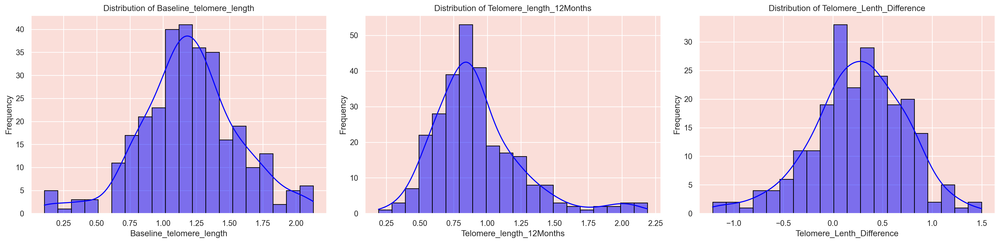

In [81]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Given variable names
variables_of_interest = ['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']

# Select only the specified variables from the dataset
selected_variables = IMD_Dataset[variables_of_interest]

# Define colors
hist_color = 'blue'
kde_color = 'red'

# Set up the subplot
fig, ax = plt.subplots(nrows=1, ncols=len(variables_of_interest), figsize=(20, 5))

# Loop to plot histograms for each selected variable
for i, var in enumerate(selected_variables.columns):
    sns.histplot(selected_variables[var], bins=20, color=hist_color, edgecolor='black', kde=True, line_kws={'color': kde_color}, ax=ax[i])
    
    ax[i].set_title(f'Distribution of {var}')
    ax[i].set_xlabel(var)
    ax[i].set_ylabel('Frequency')
    ax[i].grid(True)

plt.tight_layout()
plt.show()


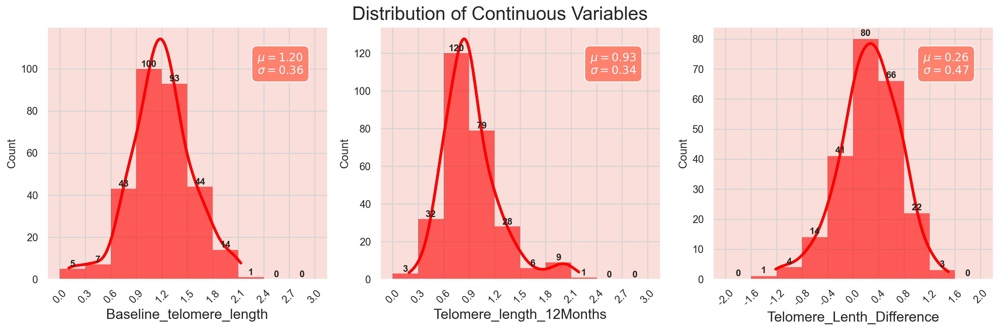

In [82]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the required variable names
variables_of_interest = ['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']

# Filter out continuous features for the univariate analysis
df_continuous = IMD_Dataset[variables_of_interest]

# Set up the subplot
fig, ax = plt.subplots(nrows=1, ncols=len(variables_of_interest), figsize=(15, 5))

# Loop to plot histograms for each continuous feature
for i, col in enumerate(df_continuous.columns):
    values, bin_edges = np.histogram(df_continuous[col], 
                                     range=(np.floor(df_continuous[col].min()), np.ceil(df_continuous[col].max())))
    
    graph = sns.histplot(data=df_continuous, x=col, bins=bin_edges, kde=True, ax=ax[i],
                         edgecolor='none', color='red', alpha=0.6, line_kws={'lw': 3})
    ax[i].set_xlabel(col, fontsize=15)
    ax[i].set_ylabel('Count', fontsize=12)
    ax[i].set_xticks(np.round(bin_edges, 1))
    ax[i].set_xticklabels(ax[i].get_xticks(), rotation=45)
    ax[i].grid(color='lightgrey')
    
    for j, p in enumerate(graph.patches):
        ax[i].annotate('{}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height() + 1),
                       ha='center', fontsize=10, fontweight="bold")
    
    textstr = '\n'.join((
        r'$\mu=%.2f$' % df_continuous[col].mean(),
        r'$\sigma=%.2f$' % df_continuous[col].std()
    ))
    ax[i].text(0.75, 0.9, textstr, transform=ax[i].transAxes, fontsize=12, verticalalignment='top',
               color='white', bbox=dict(boxstyle='round', facecolor='#ff826e', edgecolor='white', pad=0.5))

plt.suptitle('Distribution of Continuous Variables', fontsize=20)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


Categorical Univariate Analysis



In [83]:
categorical_features=IMD_Dataset.columns.difference(variables_of_interest)
df_categorical=IMD_Dataset[categorical_features]

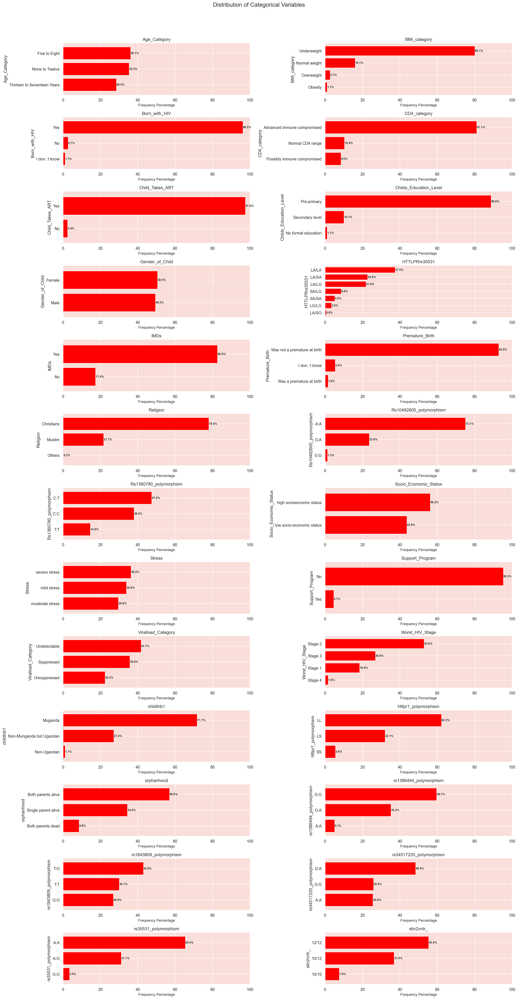

In [84]:
import numpy as np
import matplotlib.pyplot as plt

# Given variable names
variables_of_interest = ['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']

# Select categorical features
categorical_features = IMD_Dataset.columns.difference(variables_of_interest)
df_categorical = IMD_Dataset[categorical_features]

# Determine the number of rows needed (adjust if needed)
n_features = len(categorical_features)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols

# Set up the subplot
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, n_rows * 3))

# Loop to plot bar charts for each categorical feature
for i, col in enumerate(categorical_features):
    row = i // n_cols
    col_idx = i % n_cols
    
    # Calculate frequency percentages
    value_counts = IMD_Dataset[col].value_counts(normalize=True).mul(100).sort_values()
    
    # Plot bar chart
    value_counts.plot(kind='barh', ax=ax[row, col_idx], width=0.8, color='red')
    
    # Add frequency percentages to the bars
    for index, value in enumerate(value_counts):
        ax[row, col_idx].text(value, index, f'{value:.1f}%', fontsize=8, weight='bold', va='center')
    
    ax[row, col_idx].set_xlim([0, 100])
    ax[row, col_idx].set_xlabel('Frequency Percentage', fontsize=10)
    ax[row, col_idx].set_title(f'{col}', fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(ax[j // n_cols, j % n_cols])

plt.suptitle('Distribution of Categorical Variables', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


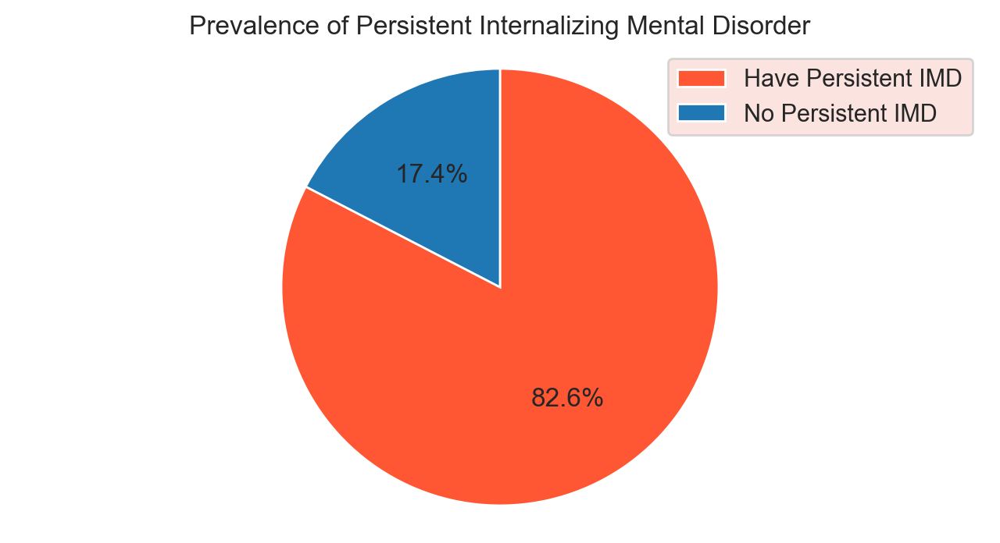

In [85]:
# Define colors for the pie chart
colors = ['#FF5733', '#1F77B4']

# Proportion of fetal health classes
plt.figure(figsize=(8, 4))  # Set the figure size
plt.pie(IMD_Dataset['IMDs'].value_counts(), startangle=90, counterclock=False, autopct='%1.1f%%', wedgeprops={'width': 1}, colors=colors)
plt.axis('equal')  # Set equal aspect ratio to make it a complete circle
plt.legend(['Have Persistent IMD', 'No Persistent IMD'])  # Set the legend labels
plt.title("Prevalence of Persistent Internalizing Mental Disorder")  # Set the title
plt.show()


BIVARIATE ANALYSIS

For our bivariate analysis on the dataset's features with respect to the target variable:

For continuous data: I am going to use bar plots to showcase the average value of each feature for the different target classes, and KDE plots to understand the distribution of each feature across the target classes. This aids in discerning how each feature varies between the two target outcomes.
For categorical data: I am going to employ 100% stacked bar plots to depict the proportion of each category across the target classes. This offers a comprehensive view of how different categories within a feature relate to the target.

Through these visualization techniques, we are going to gain a deeper understanding of the relationship between individual features and the target, revealing potential predictors for heart disease.

Numerical Features Vs Target

I am going to visualize each continuous feature against the target using two types of charts:

- Bar plots - showing the mean values.
- KDE plots - displaying the distribution for each target category.

In [86]:
IMD_Dataset.columns

Index(['Age_Category', 'Gender_of_Child', 'Childs_Education_Level', 'Religion',
       'BMI_category', 'childtrib1', 'orphanhood', 'Socio_Economic_Status',
       'Support_Program', 'Child_Takes_ART', 'Premature_Birth',
       'Born_with_HIV', 'Stress', 'Worst_HIV_Stage', 'CD4_category',
       'Viralload_Category', 'Baseline_telomere_length',
       'Telomere_length_12Months', 'Telomere_Lenth_Difference', 'stin2vntr_',
       'httlpr1_polymorphism', 'HTTLPRrs35531', 'rs35531_polymorphism',
       'Rs10482605_polymorphism', 'Rs1360780_polymorphism',
       'rs1386494_polymorphism', 'rs1843809_polymorphism',
       'rs34517220_polymorphism', 'IMDs'],
      dtype='object')

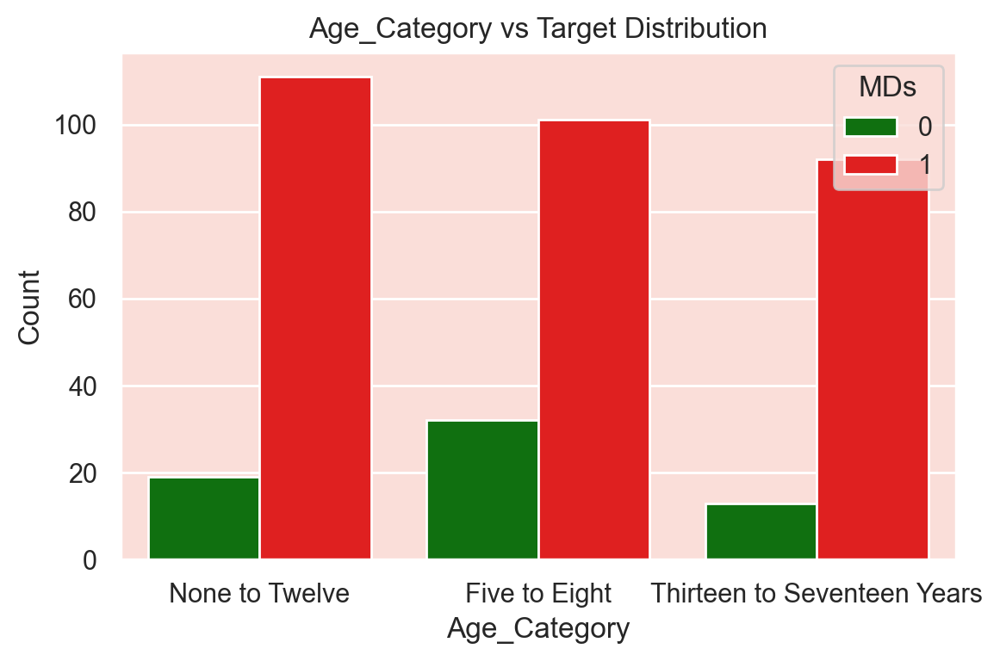

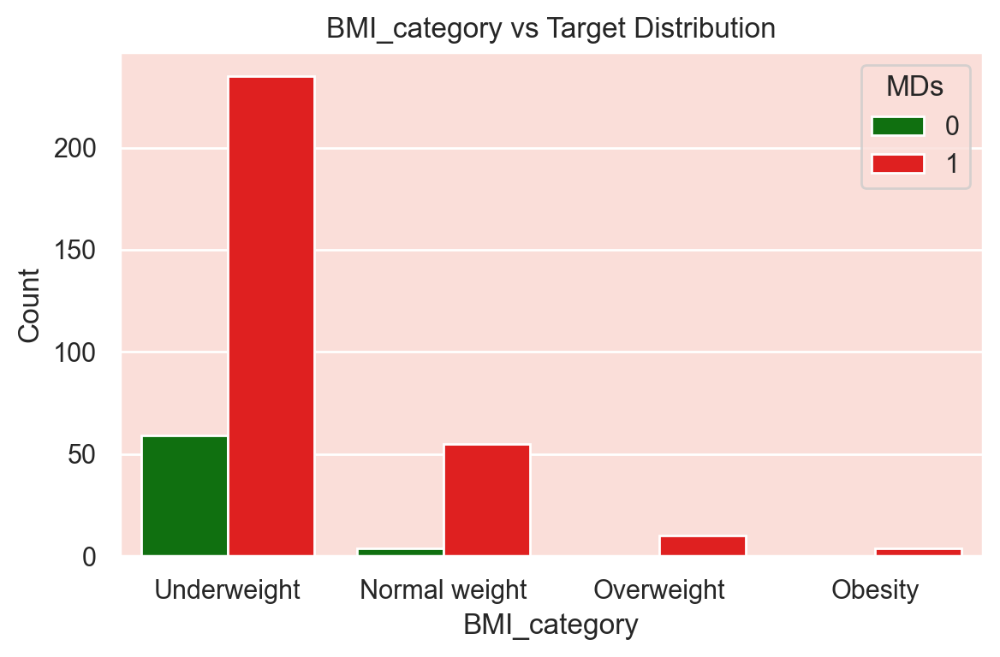

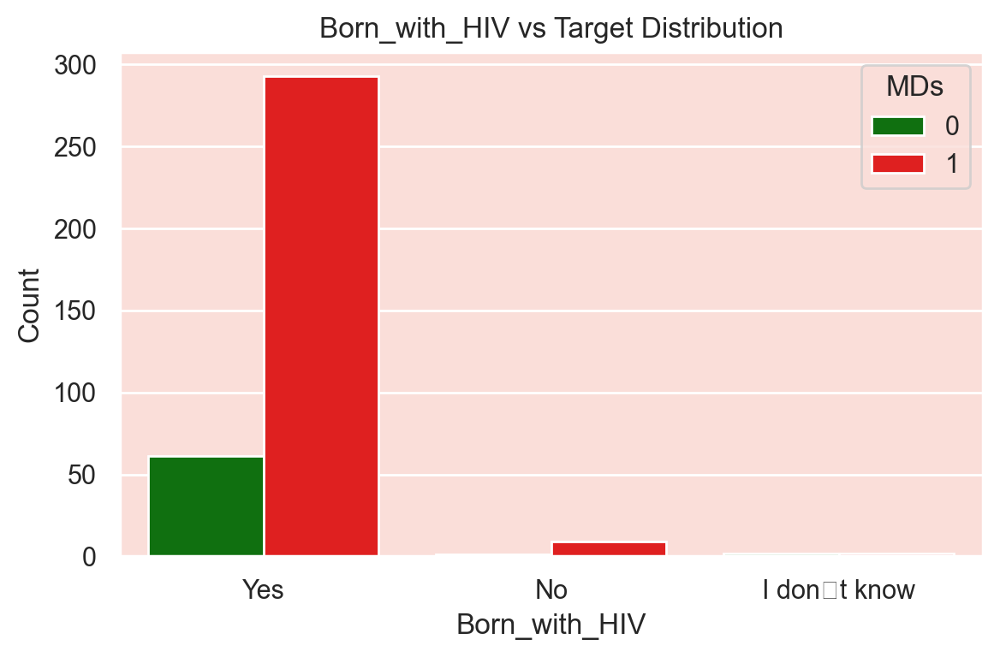

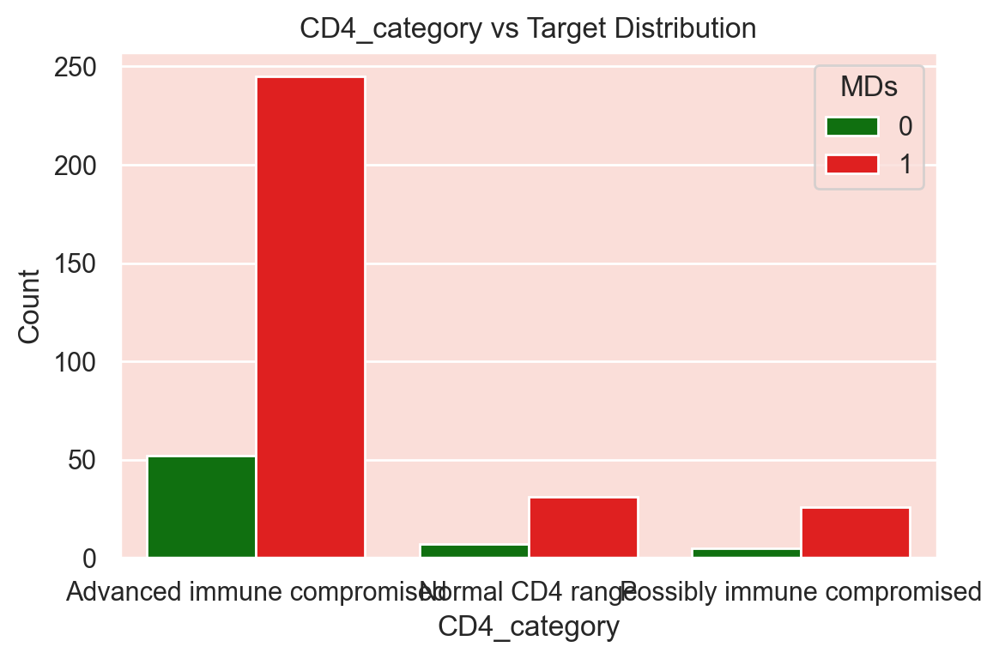

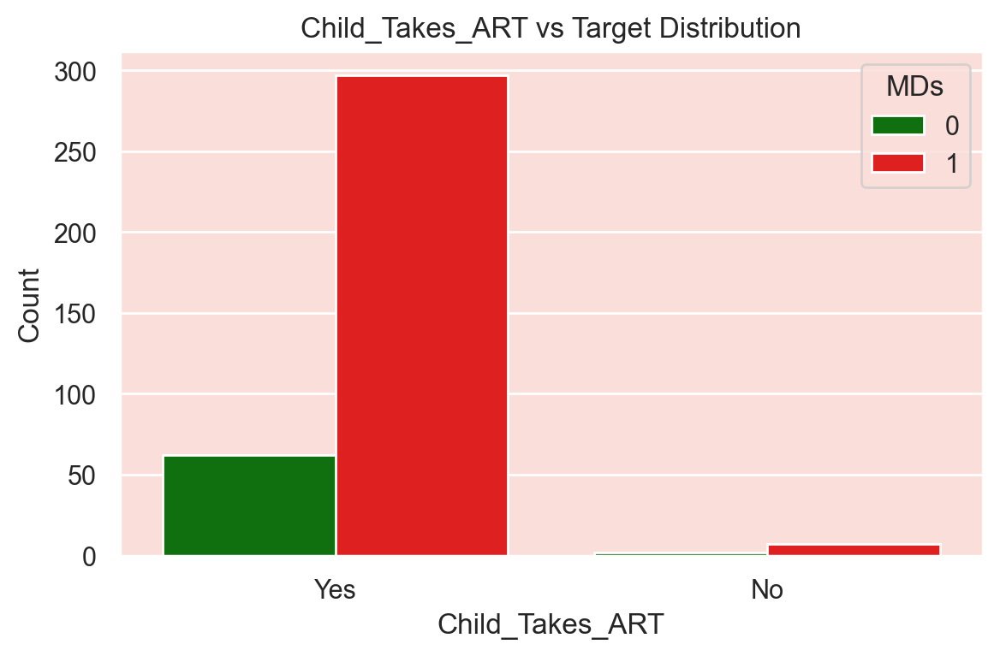

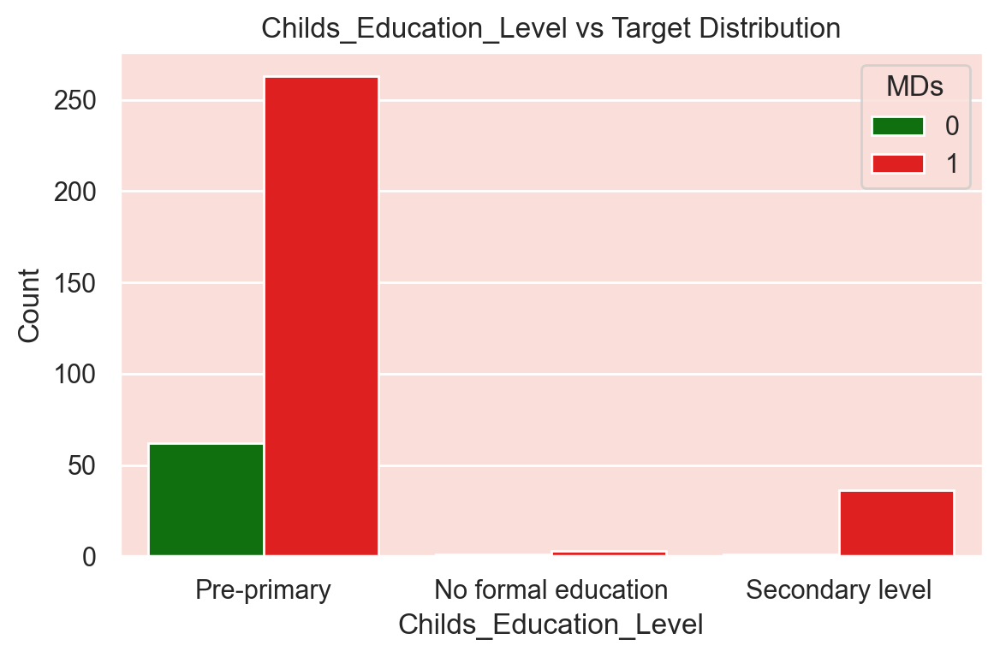

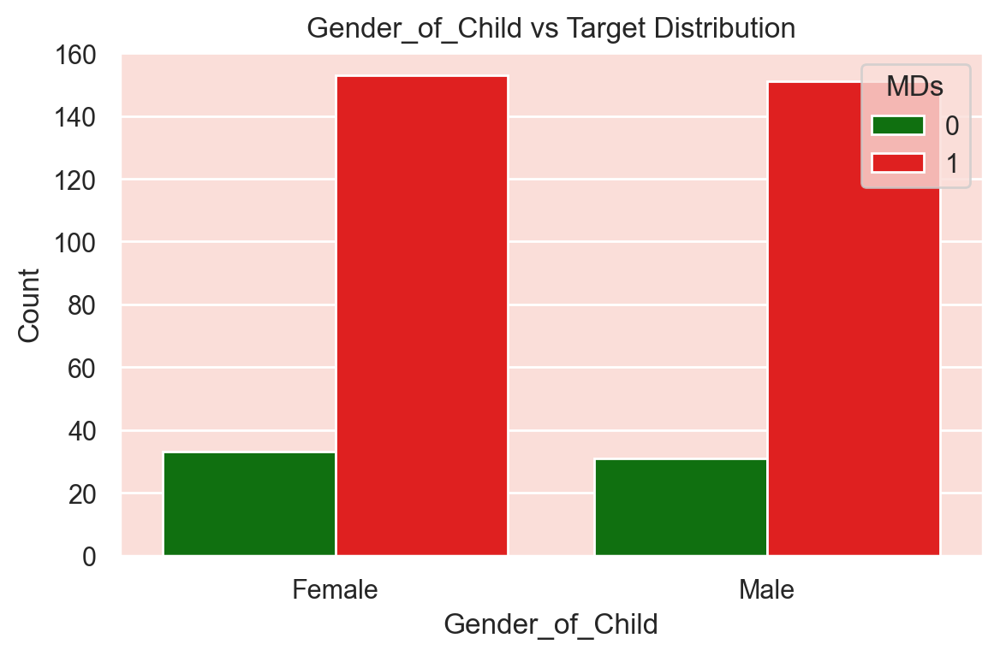

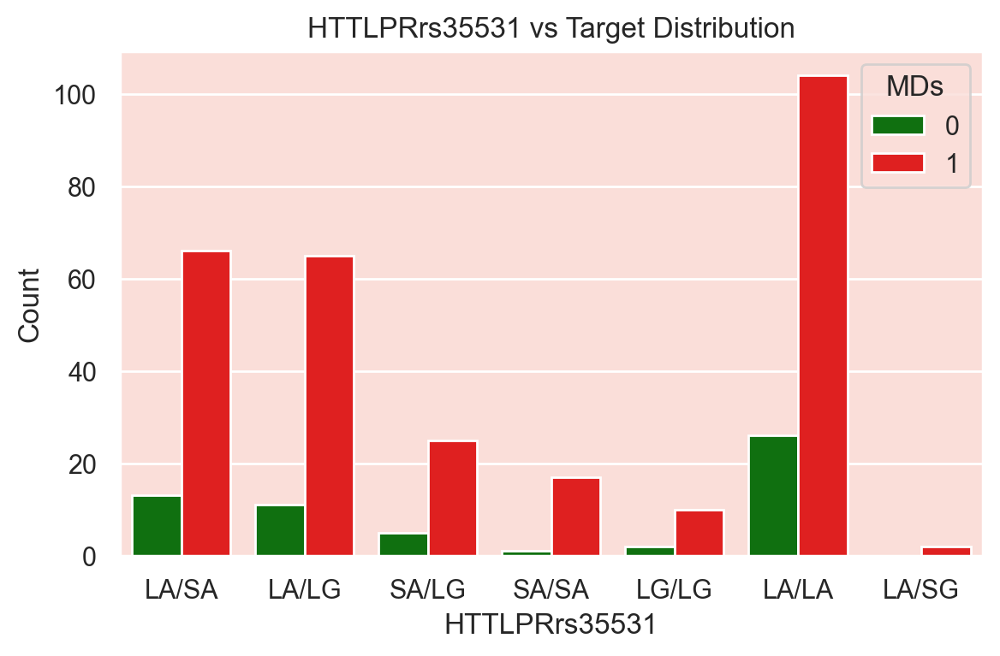

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


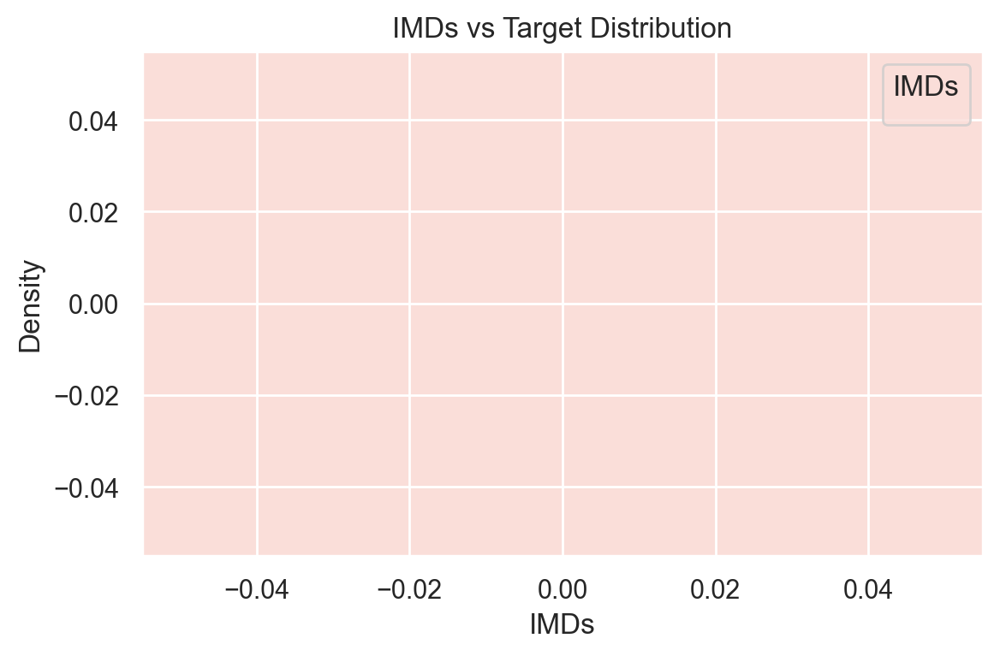

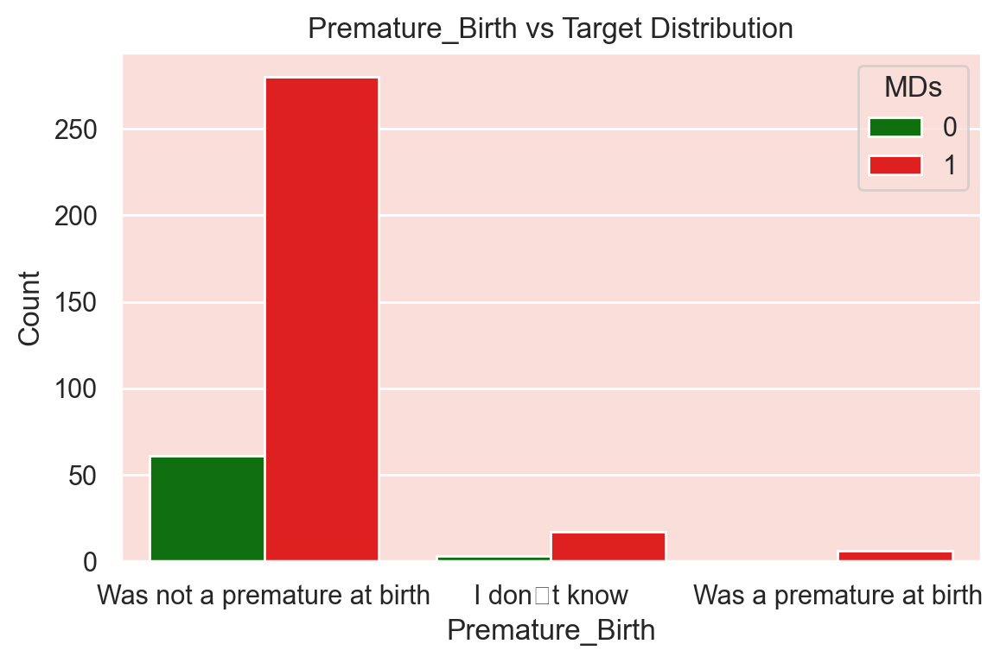

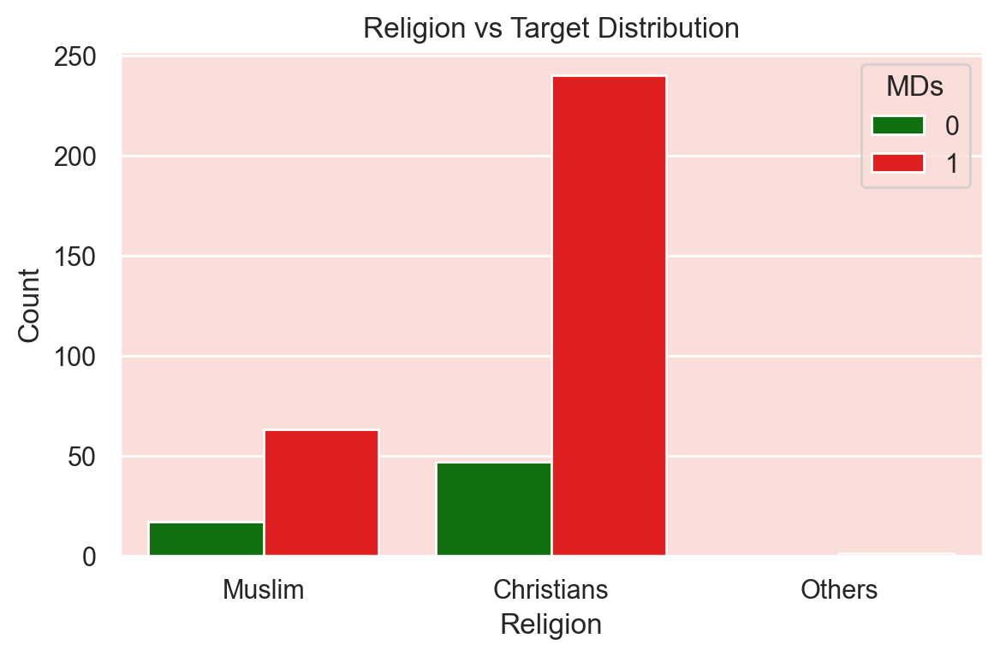

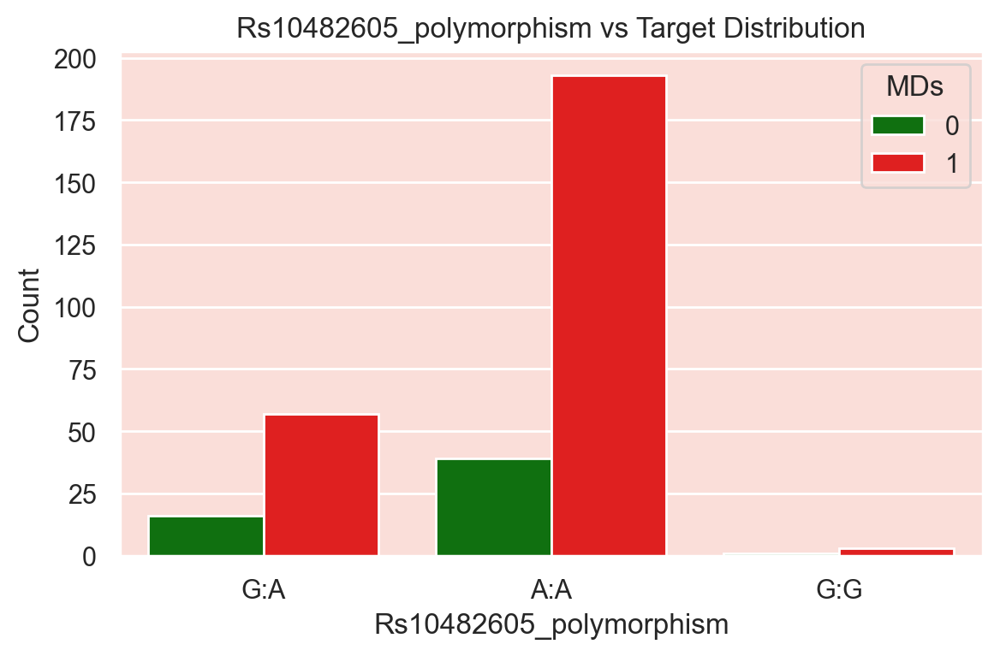

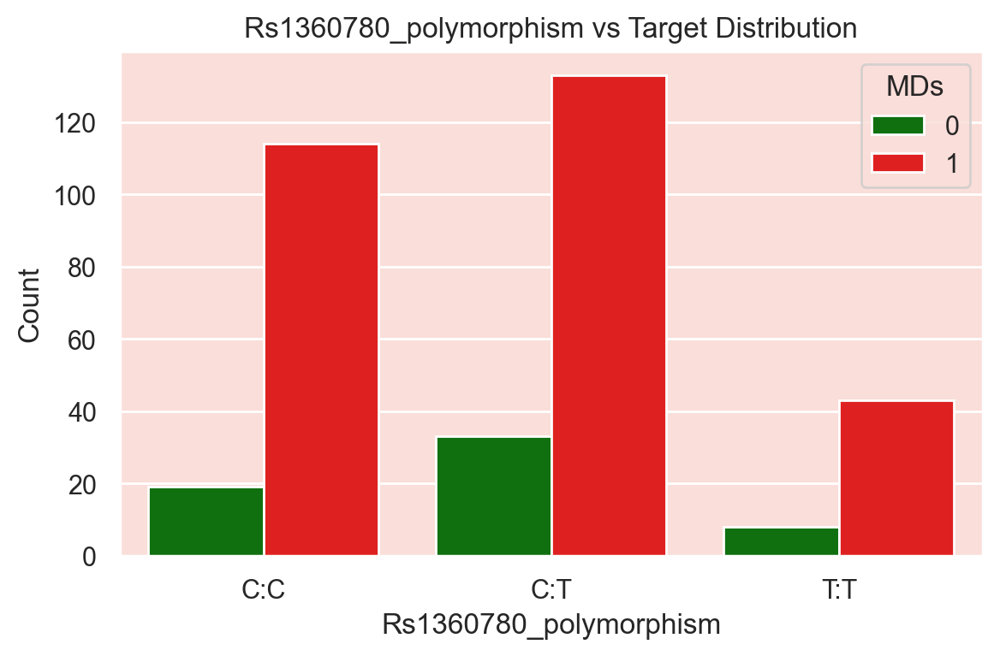

...

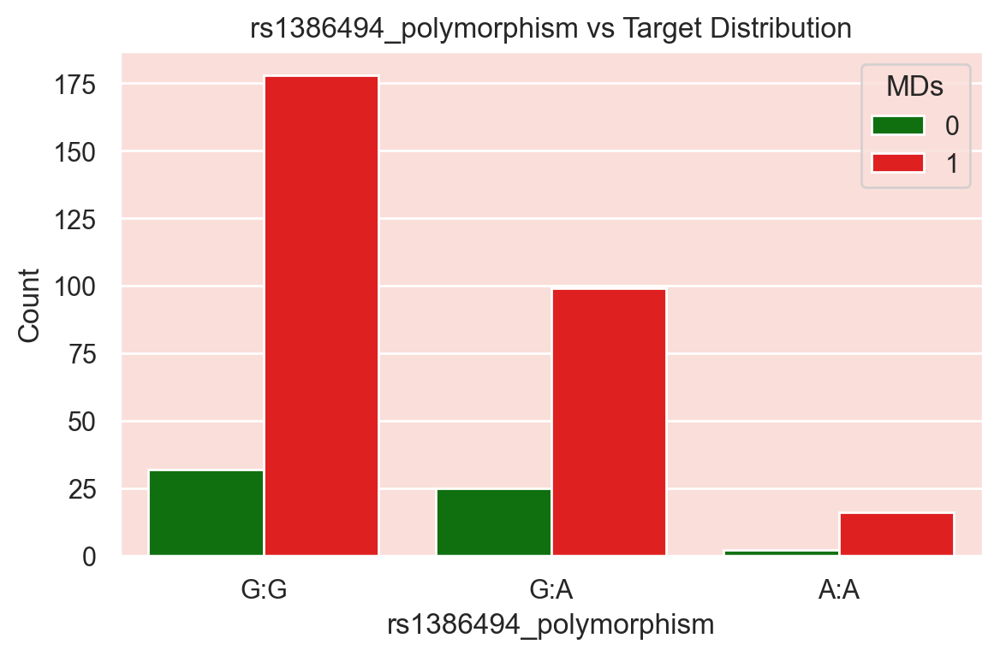

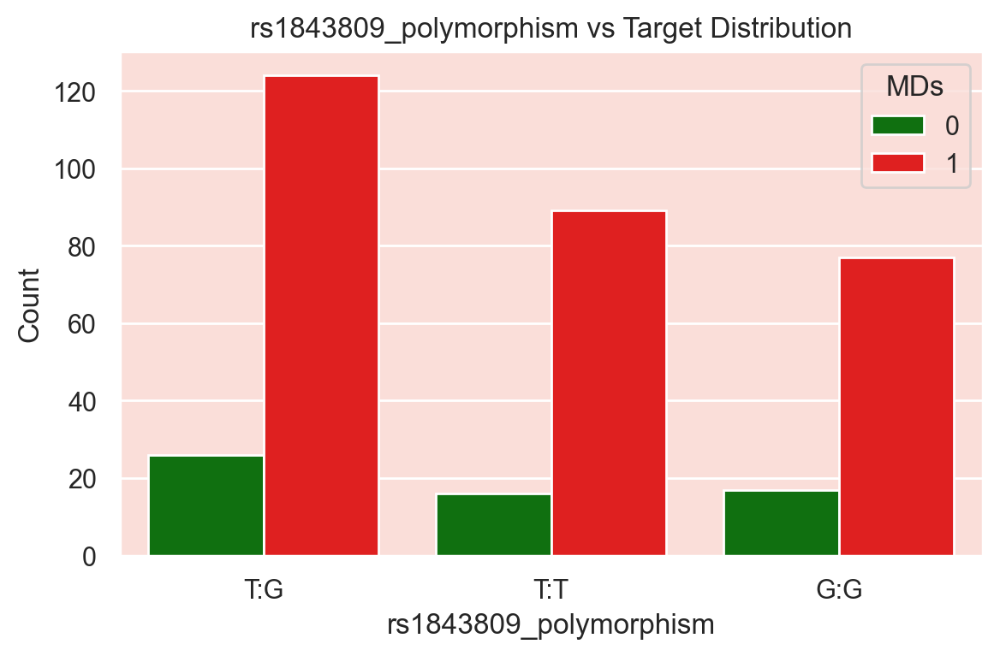

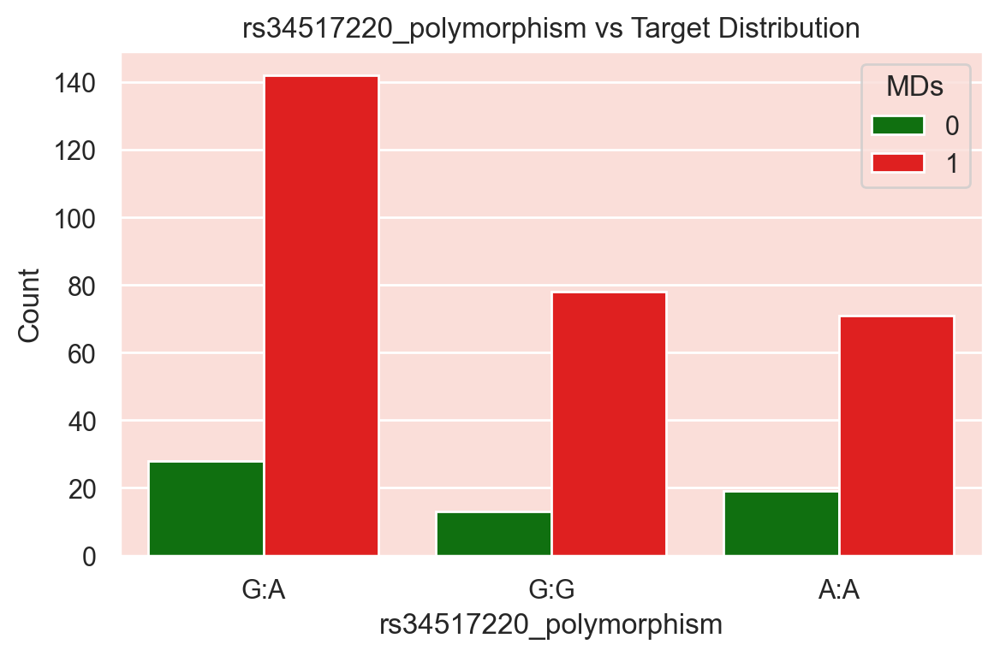

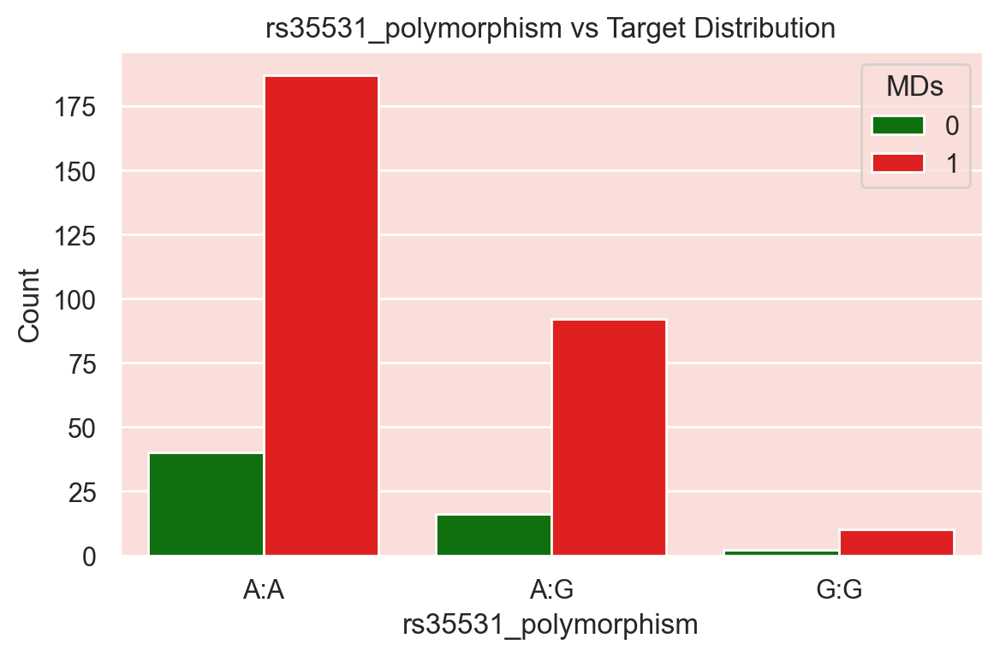

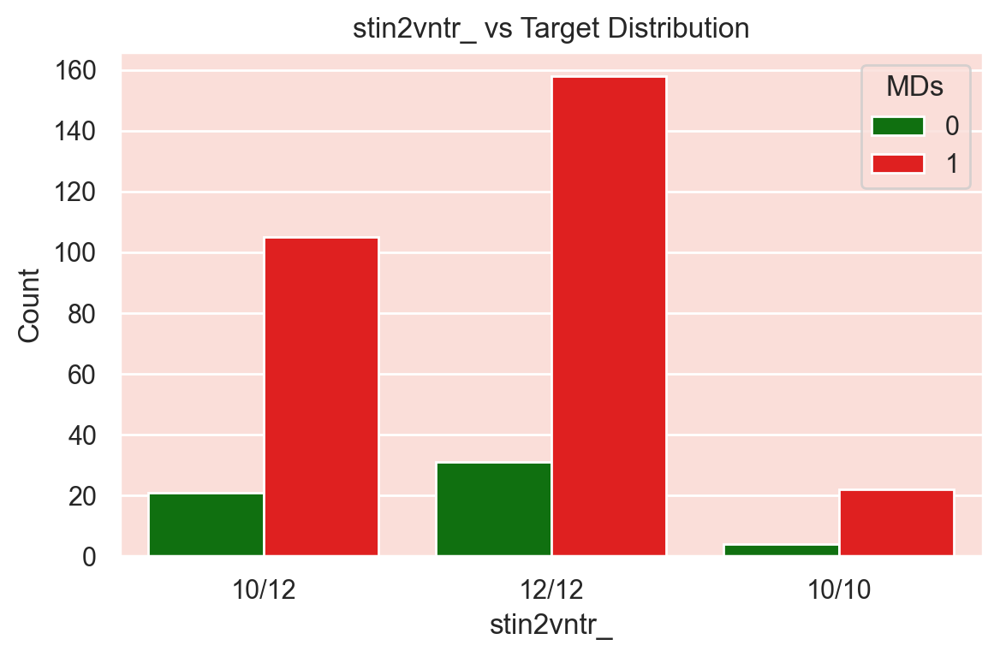

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder for the target variable 'IMDs'
label_encoder = LabelEncoder()

# Assume IMD_Dataset is defined somewhere before this code snippet
# Make a copy of the dataset for plotting
IMD_Plot_Data = IMD_Dataset.copy()

# Given variable names
variables_of_interest = ['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']

# Select categorical features
df_categorical = IMD_Plot_Data.columns.difference(variables_of_interest)
categorical_features = IMD_Plot_Data[df_categorical]

# Encode the target variable 'IMDs' if it's categorical
if IMD_Plot_Data['IMDs'].dtype == 'object' or IMD_Plot_Data['IMDs'].dtype.name == 'category':
    IMD_Plot_Data['IMDs'] = label_encoder.fit_transform(IMD_Plot_Data['IMDs'])

# Set color palette
sns.set_palette(['green', 'red'])

# Separate features and target variable
target1 = IMD_Plot_Data['IMDs']

# Loop through each categorical feature to create individual plots
for col in categorical_features.columns:
    plt.figure(figsize=(6, 4))
    if IMD_Plot_Data[col].dtype == 'object' or IMD_Plot_Data[col].dtype.name == 'category':
        # Countplot showing the distribution of the feature for each target category
        sns.countplot(x=IMD_Plot_Data[col], hue=target1)
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.legend(title='MDs', loc='upper right')
    else:
        # KDE plot showing the distribution of the feature for each target category
        sns.kdeplot(data=IMD_Plot_Data[IMD_Plot_Data["IMDs"] == 0], x=col, fill=True, linewidth=2, label='Negative')
        sns.kdeplot(data=IMD_Plot_Data[IMD_Plot_Data["IMDs"] == 1], x=col, fill=True, linewidth=2, label='Positive')
        plt.xlabel(col)
        plt.ylabel('Density')
        plt.legend(title='IMDs', loc='upper right')
    
    # Set the title for the figure
    plt.title(f'{col} vs Target Distribution', fontsize=12)
    plt.tight_layout()
    plt.show()


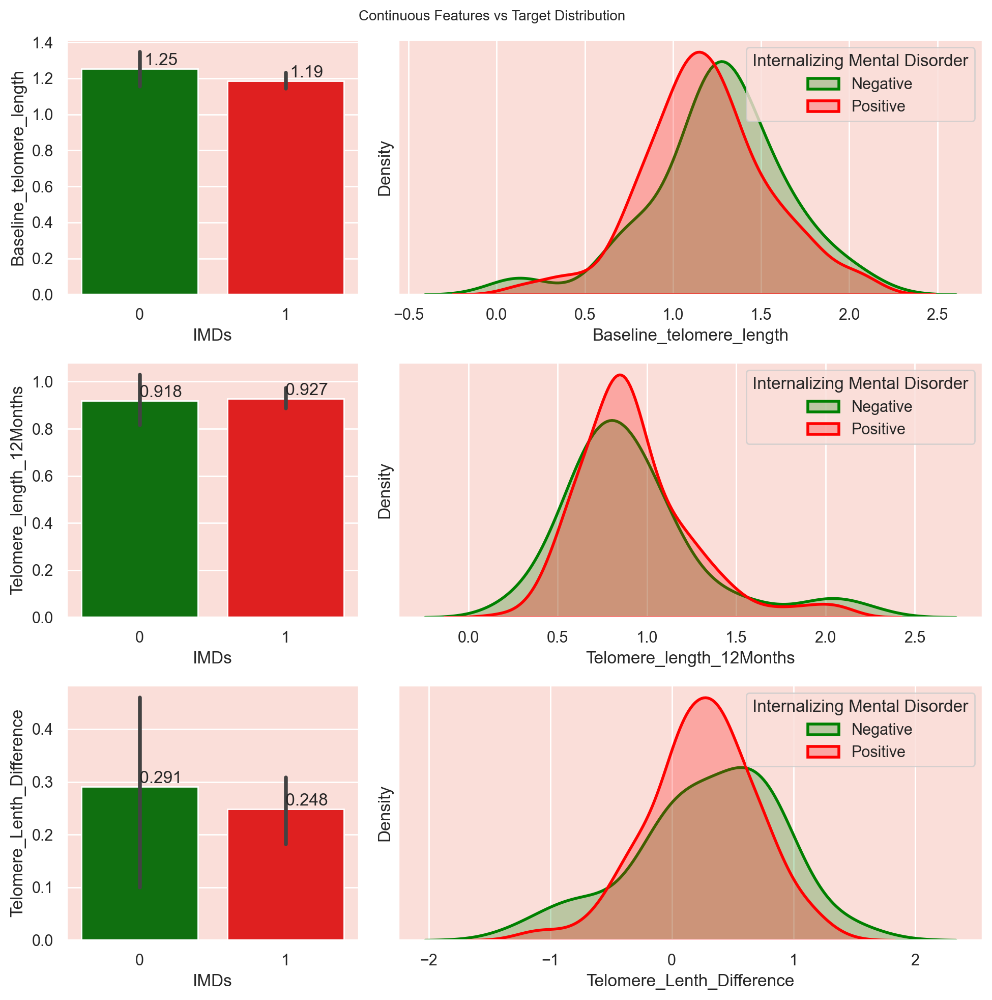

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Given variable names
variables_of_interest = ['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']
continuous_features = variables_of_interest
# Select categorical features
df_categorical = IMD_Plot_Data.columns.difference(variables_of_interest)
categorical_features = IMD_Plot_Data[df_categorical]

# Encode the target variable 'IMDs' if it's categorical
if IMD_Plot_Data['IMDs'].dtype == 'object' or IMD_Plot_Data['IMDs'].dtype.name == 'category':
    IMD_Plot_Data['IMDs'] = label_encoder.fit_transform(IMD_Plot_Data['IMDs'])

# Set color palette
sns.set_palette(['green', 'red'])

# Separate features and target variable
target1 = IMD_Plot_Data['IMDs']

# # Set color palette
# sns.set_palette(['#ff826e', 'red'])

# Create the subplots
fig, ax = plt.subplots(len(continuous_features), 2, figsize=(10,10), gridspec_kw={'width_ratios': [1, 2]})

# Loop through each continuous feature to create barplots and kde plots
for i, col in enumerate(continuous_features):
    # Barplot showing the mean value of the feature for each target category
    graph = sns.barplot(data=IMD_Plot_Data, x=target1, y=col, ax=ax[i,0])
    
    # KDE plot showing the distribution of the feature for each target category
    sns.kdeplot(data=IMD_Plot_Data[IMD_Plot_Data["IMDs"]==0], x=col, fill=True, linewidth=2, ax=ax[i,1], label='Negative')
    sns.kdeplot(data=IMD_Plot_Data[IMD_Plot_Data["IMDs"]==1], x=col, fill=True, linewidth=2, ax=ax[i,1], label='Positive')
    ax[i,1].set_yticks([])
    ax[i,1].legend(title='Internalizing Mental Disorder', loc='upper right')
    
    # Add mean values to the barplot
    for cont in graph.containers:
        graph.bar_label(cont, fmt='         %.3g')
        
# Set the title for the entire figure
plt.suptitle('Continuous Features vs Target Distribution', fontsize=10)
plt.tight_layout()                     
plt.show()

Bivariate for Categorical Features

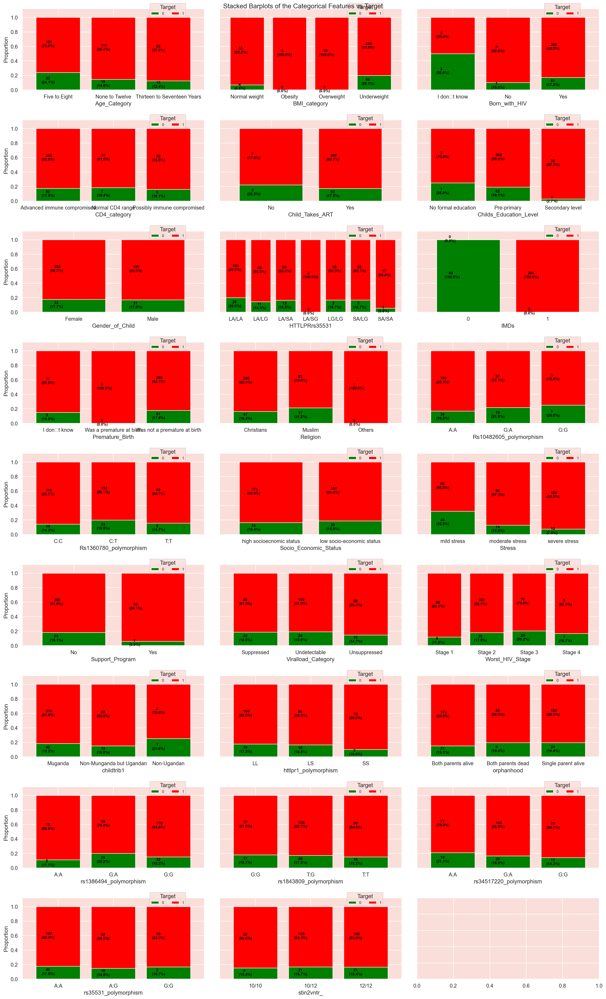

In [140]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import ListedColormap
import numpy as np

# Initialize LabelEncoder for the target variable 'IMDs'
label_encoder = LabelEncoder()

# Given variable names
variables_of_interest = ['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']

# Assuming IMD_Dataset is defined somewhere before this code snippet
# Make a copy of the dataset for plotting
IMD_Plot_Data = IMD_Dataset.copy()

# Select categorical features
df_categorical = IMD_Plot_Data.columns.difference(variables_of_interest)
categorical_features = IMD_Plot_Data[df_categorical]

# Encode the target variable 'IMDs' if it's categorical
if IMD_Plot_Data['IMDs'].dtype == 'object' or IMD_Plot_Data['IMDs'].dtype.name == 'category':
    IMD_Plot_Data['IMDs'] = label_encoder.fit_transform(IMD_Plot_Data['IMDs'])

# Initialize figure with adjusted size
fig, ax = plt.subplots(nrows=9, ncols=3, figsize=(18, 30))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.5, wspace=0.3)

# Loop through each categorical feature
for i, col in enumerate(categorical_features.columns):
    if i < 27:  # Ensure you don't exceed the number of subplots (9 rows * 3 columns = 27)
        # Calculate subplot indices
        x, y = i // 3, i % 3

        # Create a cross tabulation showing the proportion of categories for each target category
        cross_tab = pd.crosstab(index=IMD_Plot_Data[col], columns=IMD_Plot_Data['IMDs'])
        cross_tab_prop = pd.crosstab(index=IMD_Plot_Data[col], columns=IMD_Plot_Data['IMDs'], normalize='index')

        # Define colormap
        cmp = ListedColormap(['green', 'red'])

        # Plot stacked bar chart
        cross_tab_prop.plot(kind='bar', ax=ax[x, y], stacked=True, width=0.8, colormap=cmp,
                            legend=False, ylabel='Proportion', sharey=True)
     
        # Add annotations (proportions and counts) to the bars
        for idx, val in enumerate(cross_tab_prop.index):
            for (proportion, count, y_location) in zip(cross_tab_prop.loc[val], cross_tab.loc[val],
                                                       cross_tab_prop.loc[val].cumsum()):
                ax[x, y].text(x=idx - 0.3, y=(y_location - proportion) + (proportion / 2) - 0.03,
                              s=f'    {count}\n({np.round(proportion * 100, 1)}%)',
                              color="black", fontsize=8, fontweight="bold")      

        # Add legend, set y limit, and rotate xticks
        ax[x, y].legend(title='Target', loc=(0.7, 0.9), fontsize=8, ncol=2)
        ax[x, y].set_ylim([0, 1.12])
        ax[x, y].set_xticklabels(ax[x, y].get_xticklabels(), rotation=0)

# Adjust figure title and layout
plt.suptitle('Stacked Barplots of the Categorical Features vs Target', fontsize=14)
plt.tight_layout()
plt.show()


DATA PRE-PROCESSING

*Outlier Detection*

I am going to detect the outliers uding the Interquartile Range (IQR) Method for Outlier Detection for the continous features


In [146]:
IMD_Dataset.columns

Index(['Age_Category', 'Gender_of_Child', 'Childs_Education_Level', 'Religion',
       'BMI_category', 'childtrib1', 'orphanhood', 'Socio_Economic_Status',
       'Support_Program', 'Child_Takes_ART', 'Premature_Birth',
       'Born_with_HIV', 'Stress', 'Worst_HIV_Stage', 'CD4_category',
       'Viralload_Category', 'Baseline_telomere_length',
       'Telomere_length_12Months', 'Telomere_Lenth_Difference', 'stin2vntr_',
       'httlpr1_polymorphism', 'HTTLPRrs35531', 'rs35531_polymorphism',
       'Rs10482605_polymorphism', 'Rs1360780_polymorphism',
       'rs1386494_polymorphism', 'rs1843809_polymorphism',
       'rs34517220_polymorphism', 'IMDs'],
      dtype='object')

In [143]:
continuous_features

['Baseline_telomere_length',
 'Telomere_length_12Months',
 'Telomere_Lenth_Difference']

In [144]:
Q1 = IMD_Dataset[continuous_features].quantile(0.25)
Q3 = IMD_Dataset[continuous_features].quantile(0.75)
IQR = Q3 - Q1
outliers_count_specified = ((IMD_Dataset[continuous_features] < (Q1 - 1.5 * IQR)) | (IMD_Dataset[continuous_features] > (Q3 + 1.5 * IQR))).sum()
outliers_count_specified

Baseline_telomere_length     20
Telomere_length_12Months     16
Telomere_Lenth_Difference     6
dtype: int64

**Sensitivity to Outliers:**

SVM (Support Vector Machine): SVMs can be sensitive to outliers. While the decision boundary is determined primarily by the support vectors, outliers can influence which data points are chosen as support vectors, potentially leading to suboptimal classification.
Decision Trees (DT) and Random Forests (RF): These tree-based algorithms are generally robust to outliers. They make splits based on feature values, and outliers often end up in leaf nodes, having minimal impact on the overall decision-making process.
K-Nearest Neighbors (KNN): KNN is sensitive to outliers because it relies on distances between data points to make predictions. Outliers can distort these distances.
AdaBoost: This ensemble method, which often uses decision trees as weak learners, is generally robust to outliers. However, the iterative nature of AdaBoost can sometimes lead to overemphasis on outliers, making the final model more sensitive to them.

**Approaches for Outlier Treatment:**

Removal of Outliers: Directly discard data points that fall outside of a defined range, typically based on a method like the Interquartile Range (IQR).
Capping Outliers: Instead of removing, we can limit outliers to a certain threshold, such as the 1st or 99th percentile.
Transformations: Applying transformations like log or Box-Cox can reduce the impact of outliers and make the data more Gaussian-like.
Robust Scaling: Techniques like the RobustScaler in Scikit-learn can be used, which scales features using statistics that are robust to outliers.

**Conclusion:**
Given the nature of the algorithms (especially SVM and KNN) and the small size of our dataset, direct removal of outliers might not be the best approach. Instead, I focussed on applying MinMax Scaling in the subsequent steps to reduce the impact of outliers and make the data more suitable for modeling.

In [ ]:
# Checking for duplicates
IMD_Dataset.duplicated().sum()


0

In [ ]:
# Display the first few rows of the DataFrame
IMD_Dataset.isnull().sum().sum()

579

In [ ]:
IMD_Dataset.isnull().sum().sum

<bound method Series.sum of Age_Category                   0
Gender_of_Child                0
Childs_Education_Level         2
Religion                       0
BMI_category                   1
childtrib1                     0
orphanhood                     8
Socio_Economic_Status          0
Support_Program                3
Child_Takes_ART                0
Premature_Birth                1
Born_with_HIV                  0
Stress                         0
Worst_HIV_Stage                0
CD4_category                   2
Viralload_Category            66
Baseline_telomere_length      61
Telomere_length_12Months      90
Telomere_Lenth_Difference    137
stin2vntr_                    27
httlpr1_polymorphism          10
HTTLPRrs35531                 21
rs35531_polymorphism          21
Rs10482605_polymorphism       59
Rs1360780_polymorphism        18
rs1386494_polymorphism        16
rs1843809_polymorphism        19
rs34517220_polymorphism       17
IMDs                           0
dtype: int64>

**Outlier Treatment**

In [ ]:
import pandas_profiling

# create an EDA report using pandasprofiling
profile3 = IMD_Dataset.profile_report()

# Saving the profile report
profile3.to_file("Profile_Persistent_Raw.html")

# Display the profile report
display(profile3)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Observations from pandas profiling
- `General Statistics:` There were about 29 variables. with 368 observations. The missing cells composed of 6.5%. There were no duplicates.
- `Presence of a highly imbalanced variable:` There were over 15 varaibles that were imbalanced and this informed our decision on the metrcs for selcetion of best model

**IMPUTATIONS OF MISISNG VALUES**

- The SimpleImputer was the ebst choice to be used.

In [ ]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Separate features and target variable
IMD_2 = IMD_Dataset.copy()
# Identify numerical and categorical (object) columns
numerical_cols = IMD_2.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = IMD_2.select_dtypes(include=['object']).columns

# Impute missing values for numerical columns
numerical_imputer = SimpleImputer(strategy='mean')
numerical_imputed = pd.DataFrame(numerical_imputer.fit_transform(IMD_2[numerical_cols]), columns=numerical_cols)

# Impute missing values for categorical columns
categorical_imputer = SimpleImputer(strategy='most_frequent')
categorical_imputed = pd.DataFrame(categorical_imputer.fit_transform(IMD_2[categorical_cols]), columns=categorical_cols)

# Combine imputed numerical and categorical columns
IMD_2_imputed = pd.concat([numerical_imputed, categorical_imputed], axis=1)

#Export the Imputed Data for STATA Analysis 
IMD_2_imputed.to_stata("Persistent_IMD_Imputed_Data.dta", version=118)

#Check for misisng vlaues again
IMD_2_imputed.isnull().sum().sum()

0

<Axes: >

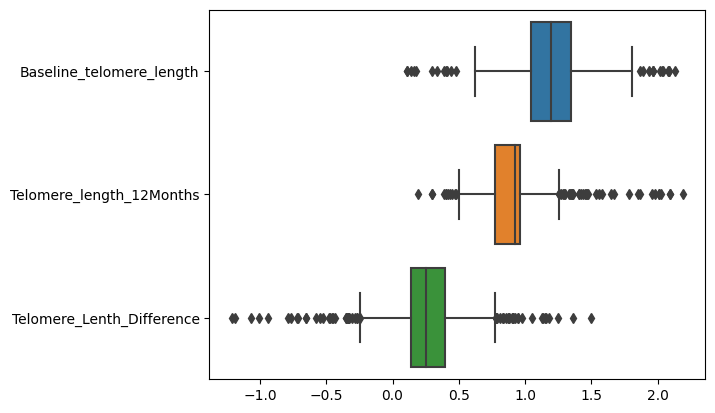

In [ ]:
# Scaling
#Ploting the data before rescaling

sns.boxplot(IMD_2_imputed, orient = 'h')

<Axes: >

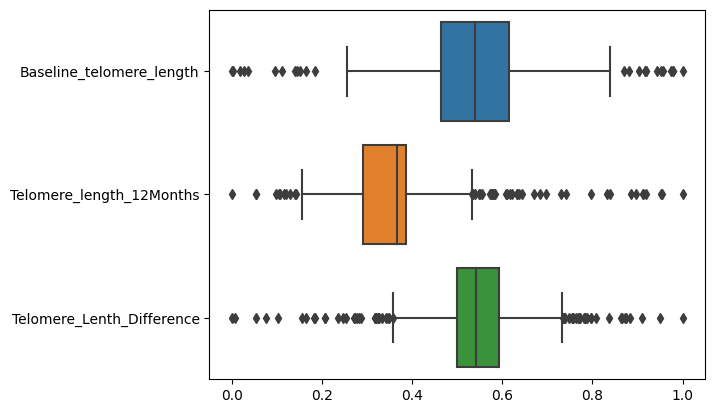

In [ ]:
# MinMax Scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
IMD_2_imputed[['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']] = scaler.fit_transform(IMD_2_imputed[['Baseline_telomere_length', 'Telomere_length_12Months', 'Telomere_Lenth_Difference']])
#print(IMD_Copy.head(5))
sns.boxplot(IMD_2_imputed, orient = 'h')

### 3. Prepare Data

a) Data Cleaning

b) Feature Selection

c) Data Transforms



In [153]:
IMD_Plot_Data. columns

Index(['Age_Category', 'Gender_of_Child', 'Childs_Education_Level', 'Religion',
       'BMI_category', 'childtrib1', 'orphanhood', 'Socio_Economic_Status',
       'Support_Program', 'Child_Takes_ART', 'Premature_Birth',
       'Born_with_HIV', 'Stress', 'Worst_HIV_Stage', 'CD4_category',
       'Viralload_Category', 'Baseline_telomere_length',
       'Telomere_length_12Months', 'Telomere_Lenth_Difference', 'stin2vntr_',
       'httlpr1_polymorphism', 'HTTLPRrs35531', 'rs35531_polymorphism',
       'Rs10482605_polymorphism', 'Rs1360780_polymorphism',
       'rs1386494_polymorphism', 'rs1843809_polymorphism',
       'rs34517220_polymorphism', 'IMDs'],
      dtype='object')

ENCODING

In [156]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer

# Assuming IMD_Plot_Data is your DataFrame with all features including categorical and ordinal ones
nominal_list = ['Gender_of_Child', 'Religion', 'childtrib1', 'orphanhood', 'Support_Program']
ordinal_features = IMD_Plot_Data.columns.difference(nominal_list)
nominal_features = IMD_Plot_Data[nominal_list]

# Separate features and target variable
X = IMD_Plot_Data.drop('IMDs', axis=1)  # Assuming 'IMDs' is the target variable

# Define the preprocessing pipeline using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('nom', OneHotEncoder(drop='first'), nominal_list),  # One-hot encode categorical variables
        ('ord', OrdinalEncoder(), list(ordinal_features))  # Ordinal encode ordinal variables
    ],
    remainder='passthrough'  # Handle remaining columns (if any) unchanged
)

# Apply the preprocessing pipeline to transform the data
X_transformed = preprocessor.fit_transform(X)

# Convert the transformed data back to a DataFrame (if needed)
transformed_columns = list(preprocessor.named_transformers_['nom'].get_feature_names(nominal_list)) + list(ordinal_features)
X_transformed_df = pd.DataFrame(X_transformed, columns=transformed_columns)

# Display the transformed DataFrame
X_transformed_df.head()


ValueError: A given column is not a column of the dataframe

In [ ]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Normalizer, OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Separate features and target variable
IMD_Copy = IMD_2_imputed.copy()

# Label encode the IMD_Copy variable if it's categorical
for column in IMD_Copy.columns:
    if IMD_Copy[column].dtype == 'object' or IMD_Copy[column].dtype.name == 'category':
        label_encoder = LabelEncoder()
        IMD_Copy[column] = label_encoder.fit_transform(IMD_Copy[column])
IMD_Copy.head(5)

,Baseline_telomere_length,Telomere_length_12Months,Telomere_Lenth_Difference,Age_Category,Gender_of_Child,Childs_Education_Level,Religion,BMI_category,childtrib1,orphanhood,...,stin2vntr_,httlpr1_polymorphism,HTTLPRrs35531,rs35531_polymorphism,Rs10482605_polymorphism,Rs1360780_polymorphism,rs1386494_polymorphism,rs1843809_polymorphism,rs34517220_polymorphism,IMDs
0,0.613136,0.380805,0.593485,1,0,1,1,3,0,0,...,2,0,0,0,0,1,2,1,1,1
1,0.305893,0.503692,0.273371,0,1,1,0,3,0,0,...,1,1,2,0,1,0,2,1,1,1
2,0.551600,0.367286,0.542083,0,1,1,0,3,0,2,...,1,0,1,1,0,1,2,1,1,1
3,0.534723,0.369783,0.543041,1,0,1,0,3,0,0,...,2,0,1,1,1,0,2,1,2,1
4,0.532216,0.349437,0.556171,0,1,1,0,3,0,0,...,1,1,5,1,0,1,2,2,0,0


*Droping tldiff*

I had to drop this becuase it failed to imput misisng values, eeven after trying to trasnfom. presence of missing values was affecting model training. 

In [ ]:
# Drop the original 'tldiff' column
# IMD_Copy.drop(columns=['tldiff'], inplace=True)


In [ ]:
# create an EDA report using pandasprofiling
profile4 = IMD_Copy.profile_report()

#Saving the profile report
profile4.to_file("Profile_Persistent_Transformed_Imputed.html")

# Display the profile report
display(profile4)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

MODEL BUILDING

In [ ]:
# Since IMD_Copy contains both features and the target variable
# Separate features and target variable
features = IMD_Copy.drop('IMDs', axis=1)
target = IMD_Copy['IMDs']

In [ ]:
# 4. Evaluate Algorithms
# a) Split-out validation dataset
# b) Test options and evaluation metric
# c) Spot Check Algorithms
# d) Compare Algorithms



**Model Spot-checking**

The following classifiers have been used in the model spot-checking
- Dummy Classifier - Not Included to check for accuracy given only most frequent class is always predicted as target. Taken as lower baseline classifier.
- Logistic Regression
- Naive Bayes
- K-Nearest Neighbours
- Support Vector Machines - Support Vector Classifier
- Decision Trees
- Ensemble classifiers (Random Forests, Gradient Boosting Classifier and AdaBoostClassifier)

The chosen evaluation metric was `f1-score`. However, other metrics `precision`, `recall`, `roc_auc` were also employed to do model spot checking.

The **`_weighted`** versions of the metrics have been used to cater for `target imbalances` in the data. For `roc_auc`, the **`_ovo` (one versus one (ovo))** was used to cater for `imbalances` in the data too. The ovo is insensitive to data label imbalances unlike the `one versus rest` version.

The `StratifiedKFold` was used in `cross validation` to ensure each `split` contains equivalent proportions of the different `classes` in the data.

At first, the `DummyClassifier` was used to set a `baseline score` given one choses the target value at random or selects the most frequent class.

NOTE:

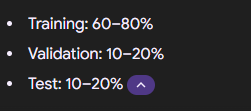

MANUAL VLAIDATION

In [ ]:
# # Module Imports
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, roc_auc_score
# from sklearn.naive_bayes import GaussianNB
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.svm import SVC
# from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
# from sklearn.linear_model import LogisticRegression
# import numpy as np

# # Instantiating the models
# lr = LogisticRegression()
# nb = GaussianNB()
# knn = KNeighborsClassifier()
# dt = DecisionTreeClassifier()
# sv = SVC(probability=True)  # Probability set to True to return a non-NaN roc_auc
# rf = RandomForestClassifier()
# gb = GradientBoostingClassifier()
# ad = AdaBoostClassifier()
# lda = LinearDiscriminantAnalysis()

# # Split the data into training and test sets
# X_train_val, X_test, y_train_val, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# # Split the training set into training and validation sets
# X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)
# # Note: 0.25 * 0.8 = 0.2 of the original dataset

# # Define models
# models = [lr, nb, knn, dt, sv, rf, gb, ad, lda]
# model_names = ["Logistic Regression", "Naive Bayes", "K-Nearest Neighbors", "Decision Tree", "Support Vector Classifier", 
#                "Random Forest", "Gradient Boosting", "AdaBoost", "Linear Discriminant Analysis"]

# # Define metrics
# metrics = {
#     "f1_weighted": f1_score,
#     "precision_weighted": precision_score,
#     "recall_weighted": recall_score,
#     "accuracy": accuracy_score,
#     "roc_auc_ovo_weighted": roc_auc_score
# }

# # Initialize dictionaries to store results
# results = {metric: [] for metric in metrics}

# # Evaluate models
# for model, model_name in zip(models, model_names):
#     model.fit(X_train, y_train)
#     y_pred = model.predict(X_val)
    
#     for score_name, score_func in metrics.items():
#         if score_name == "roc_auc_ovo_weighted":
#             y_pred_prob = model.predict_proba(X_val)
#             # Ensure y_val and y_pred_prob are correctly shaped
#             if y_val.ndim > 1 and y_val.shape[1] > 1:
#                 y_val_single = np.argmax(y_val, axis=1)  # Convert one-hot encoded to labels
#             else:
#                 y_val_single = y_val
#             score = score_func(y_val_single, y_pred_prob, multi_class='ovo')
#         elif score_name == "accuracy":
#             score = score_func(y_val, y_pred)
#         else:
#             score = score_func(y_val, y_pred, average='weighted')
        
#         results[score_name].append((model_name, score))

# # Print results grouped by metric type and sorted in descending order
# for score_name, scores in results.items():
#     sorted_scores = sorted(scores, key=lambda x: x[1], reverse=True)
#     print(f"\n{score_name} scores:")
#     for model_name, score in sorted_scores:
#         print(f"{model_name}: {score}")


CROSS VALIDATION

In [ ]:
# from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Instantiating the models
# dc = DummyClassifier(strategy='most_frequent')
lr = LogisticRegression()
nb = GaussianNB()
knn = KNeighborsClassifier()
dt = DecisionTreeClassifier()
sv = SVC(probability=True)  # Probability set to True to return a non-NaN roc_auc
rf = RandomForestClassifier()
gb = GradientBoostingClassifier()
ad = AdaBoostClassifier()
lda = LinearDiscriminantAnalysis()

from sklearn.model_selection import StratifiedKFold

# Setting the StratifiedKFold parameter
skfold = StratifiedKFold(n_splits=10, random_state=42, shuffle=True)
# ^ This creates a StratifiedKFold object with 10 splits, ensuring that each fold has approximately the same class distribution as the original dataset.
#   `random_state=42` ensures reproducibility of results, while `shuffle=True` shuffles the data before splitting into folds.

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
import warnings
# Suppress warnings
warnings.filterwarnings("ignore")

# Define models and scores as you did
models = [lr, nb, knn, dt, sv, rf, gb, ad, lda]
scores = ["f1_weighted", "precision_weighted", "recall_weighted", "accuracy", "roc_auc_ovo_weighted"]

# Initialize lists to store scores for each model
f1 = []
precision = []
recall = []
accuracy = []
roc_auc = []
score_lists = [f1, precision, recall, accuracy, roc_auc]

# Define the number of folds for cross-validation
n_splits = 10  # You can adjust this number as needed

# Split the data into training and testing sets
# Assuming features and target are already defined
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Initialize StratifiedKFold for cross-validation
skfold = StratifiedKFold(n_splits=n_splits, random_state=42, shuffle=True)

# For loop to evaluate the models
for model in models:
    print(model)
    for index, score in enumerate(scores):
        cv_scores = cross_val_score(model, X_train, y_train, cv=skfold, scoring=score)
        score_lists[index].append(np.mean(cv_scores))
        print(score + " : " + str(np.mean(cv_scores)))
    print("\n")


LogisticRegression()
f1_weighted : 0.7649181621530353
precision_weighted : 0.7147364878042644
recall_weighted : 0.8232183908045977
accuracy : 0.8232183908045977
roc_auc_ovo_weighted : 0.6427


GaussianNB()
f1_weighted : 0.66075543330103
precision_weighted : 0.7378763769131086
recall_weighted : 0.654712643678161
accuracy : 0.654712643678161
roc_auc_ovo_weighted : 0.5547333333333333


KNeighborsClassifier()
f1_weighted : 0.7869074926488147
precision_weighted : 0.7612149704202815
recall_weighted : 0.8266666666666665
accuracy : 0.8266666666666665
roc_auc_ovo_weighted : 0.5947166666666667


DecisionTreeClassifier()
f1_weighted : 0.7292328243499504
precision_weighted : 0.7512759462759463
recall_weighted : 0.724367816091954
accuracy : 0.7347126436781609
roc_auc_ovo_weighted : 0.5466666666666666


SVC(probability=True)
f1_weighted : 0.7770875092280427
precision_weighted : 0.7178491214163033
recall_weighted : 0.8471264367816091
accuracy : 0.8471264367816091
roc_auc_ovo_weighted : 0.636833333333

Logistic regression was chosen as the best model

In [ ]:
# Define a dictionary to store mean scores for each model and metric
model_scores = {}

# Populate the dictionary with mean scores for each model and metric
for model, f1_score, precision_score, recall_score, accuracy_score, roc_auc_score in zip(models, f1, precision, recall, accuracy, roc_auc):
    model_scores[model] = {
        "F1 Score": f1_score,
        "Precision": precision_score,
        "Recall": recall_score,
        "Accuracy": accuracy_score,
        "ROC AUC": roc_auc_score
    }

# Sort models based on each metric's score in descending order
sorted_models = {}
for metric in model_scores[model].keys():
    sorted_models[metric] = sorted(model_scores.keys(), key=lambda x: model_scores[x][metric], reverse=True)

# Print models in descending order for each metric
for metric, models in sorted_models.items():
    print(metric)
    for rank, model in enumerate(models, start=1):
        print(f"{rank}. {model}: {model_scores[model][metric]}")
    print()


F1 Score
1. GradientBoostingClassifier(): 0.7951891423770691
2. KNeighborsClassifier(): 0.7869074926488147
3. SVC(probability=True): 0.7770875092280427
4. RandomForestClassifier(): 0.7719099474467075
5. AdaBoostClassifier(): 0.766762659859889
6. LogisticRegression(): 0.7649181621530353
7. LinearDiscriminantAnalysis(): 0.7540884443310867
8. DecisionTreeClassifier(): 0.7292328243499504
9. GaussianNB(): 0.66075543330103

Precision
1. GradientBoostingClassifier(): 0.7712037351603345
2. KNeighborsClassifier(): 0.7612149704202815
3. DecisionTreeClassifier(): 0.7512759462759463
4. AdaBoostClassifier(): 0.7463197385841063
5. GaussianNB(): 0.7378763769131086
6. SVC(probability=True): 0.7178491214163033
7. RandomForestClassifier(): 0.716945529698205
8. LogisticRegression(): 0.7147364878042644
9. LinearDiscriminantAnalysis(): 0.7118497672451298

Recall
1. SVC(probability=True): 0.8471264367816091
2. RandomForestClassifier(): 0.8370114942528735
3. GradientBoostingClassifier(): 0.8300000000000001
4

Note:
Accuracy: This metric measures the proportion of correctly classified instances out of all instances. It's suitable when the class distribution is balanced and all classes are equally important.

Precision: Precision measures the proportion of true positive predictions out of all positive predictions. It's useful when the cost of false positives is high.

Recall (Sensitivity): Recall measures the proportion of true positive predictions out of all actual positive instances. It's valuable when the cost of false negatives is high.

F1 Score: The F1 score is the harmonic mean of precision and recall. It provides a balance between precision and recall and is suitable when there's an uneven class distribution.

ROC AUC: Receiver Operating Characteristic Area Under the Curve (ROC AUC) measures the area under the ROC curve, which plots the true positive rate against the false positive rate. It's suitable for binary classification problems, especially when class imbalance exists.

### Improving Accuracy

#### Hyperparameter tuning
Hyperparameter tuning is used to optimize the performance of machine learning models by searching for the best set of hyperparameters. Hyperparameters are settings that are not learned from the data but are set prior to training, such as the regularization strength in logistic regression, the depth of a decision tree, or the number of trees in a random forest.

Hyperparameter tuning is typically performed after selecting a model and before evaluating its performance on unseen data (e.g., a holdout test set). Here's a breakdown of the typical workflow involving hyperparameter tuning:

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Define the grid of hyperparameters for each model
# param_grid_dc = {}  # DummyClassifier does not have hyperparameters
param_grid_lr = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
param_grid_nb = {}  # GaussianNB does not have hyperparameters
param_grid_knn = {'n_neighbors': [3, 5, 7, 9]}
param_grid_dt = {'max_depth': [None, 5, 10, 20]}
param_grid_sv = {'C': [0.1, 1, 10], 'gamma': [0.1, 1, 10]}
param_grid_rf = {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20]}
param_grid_gb = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}
param_grid_ad = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}
param_grid_lda = {}  # LinearDiscriminantAnalysis does not have hyperparameters

# Define models to tune
models_to_tune = {'Logistic Regression': (lr, param_grid_lr),
                  'Gaussian Naive Bayes': (nb, param_grid_nb),
                  'K-Nearest Neighbors': (knn, param_grid_knn),
                  'Decision Tree': (dt, param_grid_dt),
                  'Support Vector Classifier': (sv, param_grid_sv),
                  'Random Forest': (rf, param_grid_rf),
                  'Gradient Boosting': (gb, param_grid_gb),
                  'AdaBoost': (ad, param_grid_ad),
                  'Linear Discriminant Analysis': (lda, param_grid_lda)}



IF ACCURACY WAS USED TO CHOOSE THE BEST MODEL

Logistic Regression: 0.8471264367816091
Support Vector Classifier: 0.8471264367816091
Gradient Boosting: 0.8471264367816091
AdaBoost: 0.8471264367816091
Random Forest: 0.8437931034482758
K-Nearest Neighbors: 0.8403448275862069
Linear Discriminant Analysis: 0.8027586206896553
Decision Tree: 0.7513793103448275
Gaussian Naive Bayes: 0.654712643678161

Best Model Selected: Logistic Regression


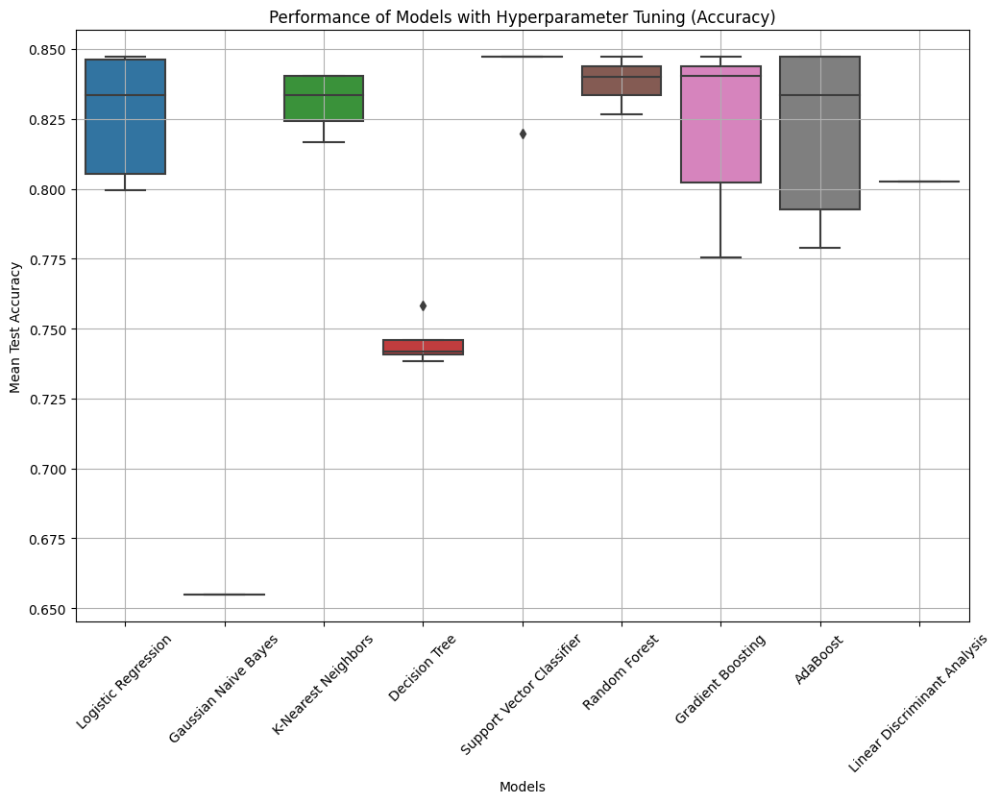

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Perform grid search for each model
best_models = {}
model_scores = {}

for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_
    model_scores[name] = grid_search.best_score_
    
# Sort models based on their scores (from best to worst)
sorted_models = sorted(model_scores.items(), key=lambda x: x[1], reverse=True)

# Print the sorted list of models with their scores
for name, score in sorted_models:
    print(f"{name}: {score}")

# Select the best model
best_model_name = sorted_models[0][0]
best_model = best_models[best_model_name]
print(f"\nBest Model Selected: {best_model_name}")

# List to store mean test accuracy for each model
mean_test_accuracy = []

# Loop through each model and perform grid search with cross-validation
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    mean_test_accuracy.append(grid_search.cv_results_['mean_test_score'])

# Create a box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=mean_test_accuracy)
plt.title('Performance of Models with Hyperparameter Tuning (Accuracy)')
plt.xlabel('Models')
plt.ylabel('Mean Test Accuracy')
plt.xticks(range(len(models_to_tune)), models_to_tune.keys(), rotation=45)
plt.grid(True)
plt.show()

IF F1 SCORE WAS USED TO CHOOSE THE BEST MODEL

Logistic Regression: 0.9171653643351757
Support Vector Classifier: 0.9171653643351757
Gradient Boosting: 0.9171653643351757
AdaBoost: 0.9171653643351757
Random Forest: 0.9151451623149736
K-Nearest Neighbors: 0.9121476008268461
Linear Discriminant Analysis: 0.8902145476507297
Decision Tree: 0.8538172448466567
Gaussian Naive Bayes: 0.7466942194688253

Best Model Selected: Logistic Regression


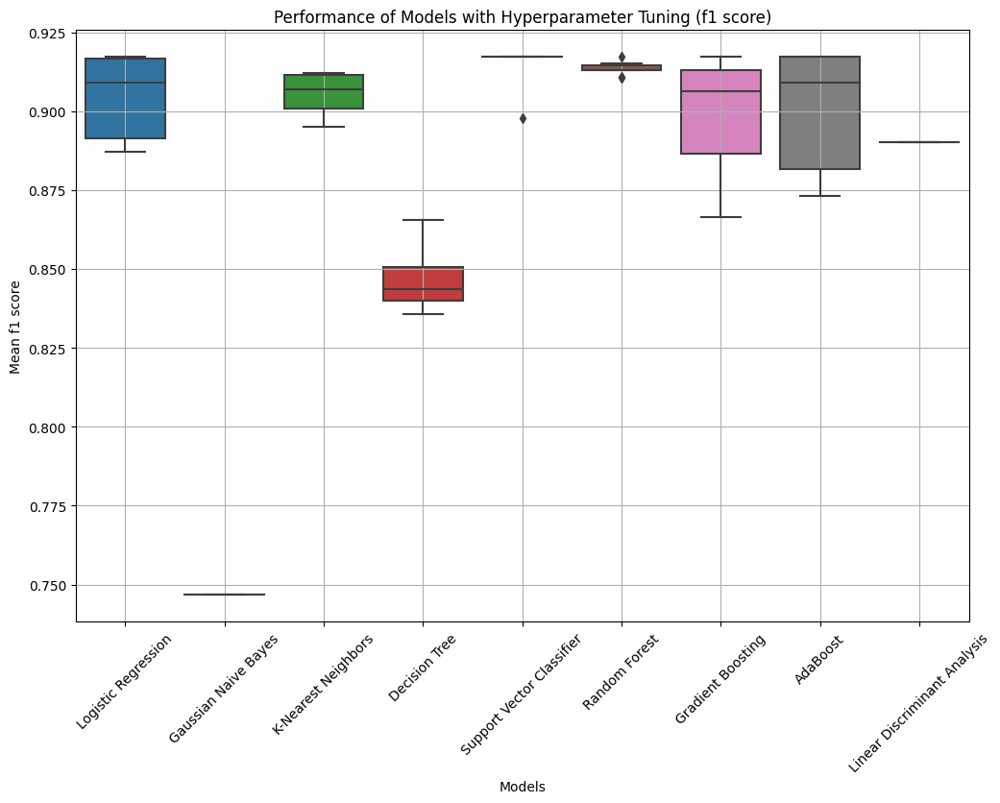

In [ ]:
# Perform grid search for each model
best_models = {}
model_scores = {}

for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='f1')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_
    model_scores[name] = grid_search.best_score_
    
# Sort models based on their scores (from best to worst)
sorted_models = sorted(model_scores.items(), key=lambda x: x[1], reverse=True)

# Print the sorted list of models with their scores
for name, score in sorted_models:
    print(f"{name}: {score}")

# Select the best model
best_model_name = sorted_models[0][0]
best_model_f1 = best_models[best_model_name]
print(f"\nBest Model Selected: {best_model_name}")

# List to store mean f1 score for each model
mean_test_f1 = []

# Loop through each model and perform grid search with cross-validation
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='f1')
    grid_search.fit(X_train, y_train)
    mean_test_f1.append(grid_search.cv_results_['mean_test_score'])

# Create a box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=mean_test_f1)
plt.title('Performance of Models with Hyperparameter Tuning (f1 score)')
plt.xlabel('Models')
plt.ylabel('Mean f1 score')
plt.xticks(range(len(models_to_tune)), models_to_tune.keys(), rotation=45)
plt.grid(True)
plt.show()

Alternative method to Improving Performnace is Ensemble methods 
Ensemble methods are techniques that combine multiple individual models to improve the overall predictive performance compared to any single model. They work by leveraging the wisdom of the crowd, where the collective decision of multiple models tends to be more accurate and robust than the decision of any individual model. Some popular ensemble methods for improving accuracy include:

Bagging (Bootstrap Aggregating):

Random Forest: Constructs multiple decision trees during training and outputs the mode of the classes as the prediction (classification) or average prediction (regression) of the individual trees.
Bagged Decision Trees: Similar to Random Forest but typically with decision trees as base learners.
Boosting:

AdaBoost (Adaptive Boosting): Iteratively trains weak classifiers (e.g., shallow decision trees) on different subsets of the training data, giving more weight to misclassified samples in subsequent iterations.
Gradient Boosting Machines (GBM): Builds an ensemble of trees sequentially, where each new tree corrects the errors made by the previous ones by fitting residuals.
Stacking (Stacked Generalization):

Stacked Ensemble: Combines the predictions of multiple models (base learners) using a meta-model (often logistic regression or another model) that learns how to best combine the predictions.
Voting:

Voting Classifier: Combines the predictions of multiple base classifiers (e.g., decision trees, SVMs, logistic regression) and predicts the class with the most votes (hard voting) or the class with the highest average probability (soft voting).
Bayesian Model Averaging (BMA):

Bayesian Voting: Instead of using equal weights for all models, assigns different weights to models based on their performance on validation data.

In [ ]:
# 6. Finalize Model
# a) Predictions on validation dataset
# b) Create standalone model on entire training dataset
# c) Save model for later use

PERFROMANCE ON TEST DATA

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split

# # Split the test data into training and validation sets
# X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Make predictions on the validation dataset
y_pred_validation = best_model_f1.predict(X_test)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred_validation)
precision = precision_score(y_test, y_pred_validation, average='weighted')
recall = recall_score(y_test, y_pred_validation, average='weighted')
f1 = f1_score(y_test, y_pred_validation, average='weighted')

# Print evaluation metrics
print(f"Accuracy on test dataset: {accuracy}")
print(f"Precision on test dataset: {precision}")
print(f"Recall on test dataset: {recall}")
print(f"F1-score on test dataset: {f1}")


Accuracy on test dataset: 0.7432432432432432
Precision on test dataset: 0.5524105186267348
Recall on test dataset: 0.7432432432432432
F1-score on test dataset: 0.6337733081919128


FROM ORIGINAL DATA

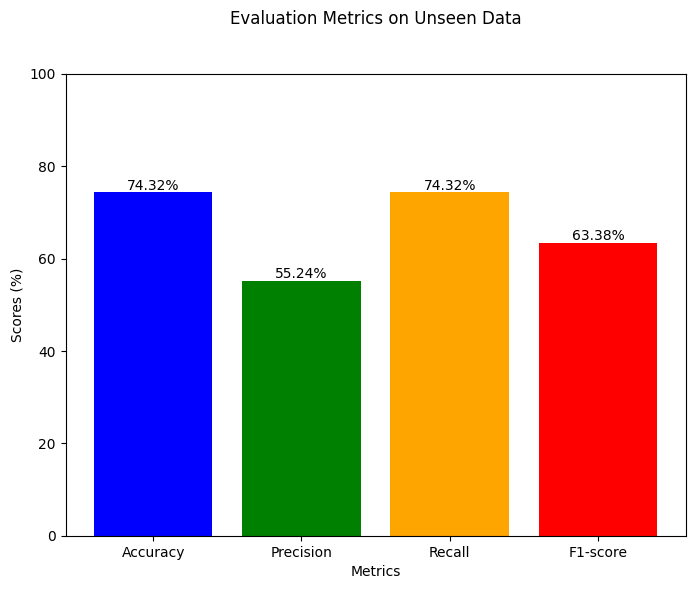

In [ ]:
import matplotlib.pyplot as plt

# Evaluation metrics
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-score']
scores = [accuracy, precision, recall, f1]

# Multiply scores by 100 to convert to percentage
scores_percentage = [score * 100 for score in scores]

# Create bar plot
plt.figure(figsize=(8, 6))
bars = plt.bar(metrics, scores_percentage, color=['blue', 'green', 'orange', 'red'])

# Add more space between the chart title and the bar graph
plt.title('Evaluation Metrics on Unseen Data\n\n')

plt.xlabel('Metrics')
plt.ylabel('Scores (%)')  # Adjust y-axis label to indicate percentage
plt.ylim(0, 100)  # Set y-axis limit to range between 0 and 100 for percentages

# Add value labels on top of the bars
for bar, score in zip(bars, scores_percentage):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), '{:.2f}%'.format(score),
             ha='center', va='bottom')

plt.show()


### FEATURE IMPORTANCE 


Feature importance is a technique used to understand which features have the most impact on a model's predictions. It helps in feature selection, model interpretation, identifying data quality issues, and gaining business insights.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_feature_importances(model, features):
    """
    Plot feature importances for the given model.
    
    Parameters:
        model (object): The trained model for which feature importances are to be plotted.
        features (DataFrame): DataFrame containing the features used for training.
    """
    # Check if the model supports feature importances
    if hasattr(model, 'feature_importances_'):
        # Get feature importances
        feature_importances = model.feature_importances_
        
        # Assuming your features are stored in a DataFrame 'features' with column names
        feature_names = features.columns
        
        # Create a DataFrame to display feature importances
        feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
        
        # Sort the DataFrame by importance in descending order
        feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
        
        # Print or visualize the feature importances
        print("Feature Importances:")
        print(feature_importance_df)

                # Plot feature importances
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
        plt.title('Feature Importances')
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.show()
    else:
        print("Feature importances are not available for this model.")

# Assuming 'best_model' is the trained model and 'features' is the DataFrame containing features
plot_feature_importances(best_model_f1, features)

Feature importances are not available for this model.


What are SHAP Values?
SHAP (SHapley Additive exPlanations) values are a way to explain the output of any machine learning model. It uses a game theoretic approach that measures each player's contribution to the final outcome. In machine learning, each feature is assigned an importance value representing its contribution to the model's output.

SHAP values show how each feature affects each final prediction, the significance of each feature compared to others, and the model's reliance on the interaction between features.

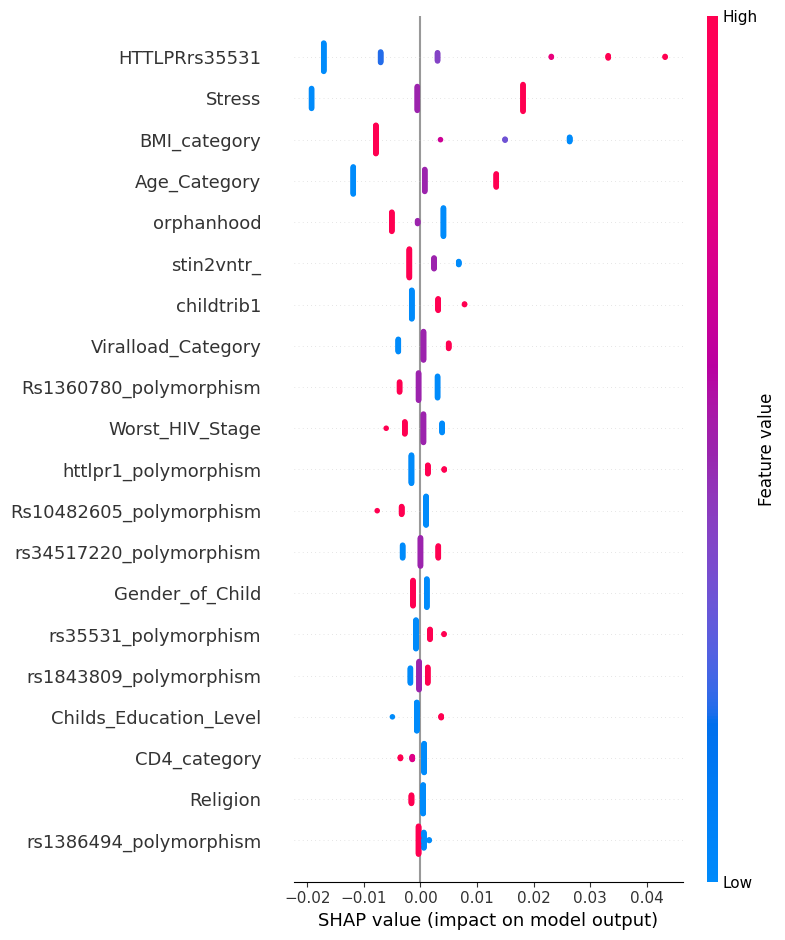

In [ ]:
import shap

# Calculate SHAP values
explainer = shap.Explainer(best_model_f1, X_train)
shap_values = explainer(X_test)

# Plot SHAP summary plot
shap.summary_plot(shap_values, X_test)


By default a SHAP bar plot will take the mean absolute value of each feature over all the instances (rows) of the dataset.

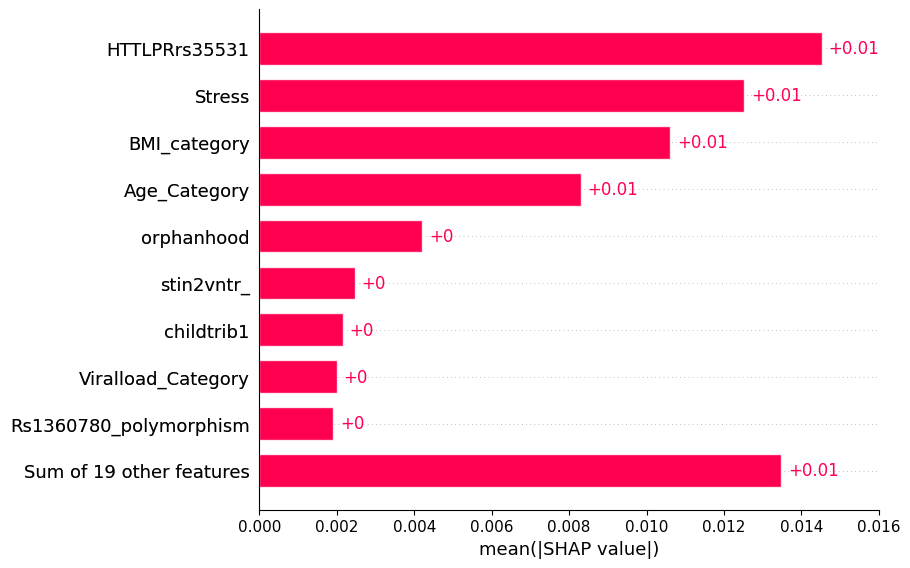

In [ ]:
import shap

# Compute SHAP values
explainer = shap.Explainer(best_model_f1, X_train)
shap_values = explainer(X_test)

# Set a display version of the data to use for plotting (has string values)
shap_values.display_data = shap.datasets.adult(display=True)[0].values

# Plot SHAP values
shap.plots.bar(shap_values)

But the mean absolute value is not the only way to create a global measure of feature importance, we can use any number of transforms. Here we show how using the max absolute value highights the Loss features, since they have infrequent but high magnitude effects.

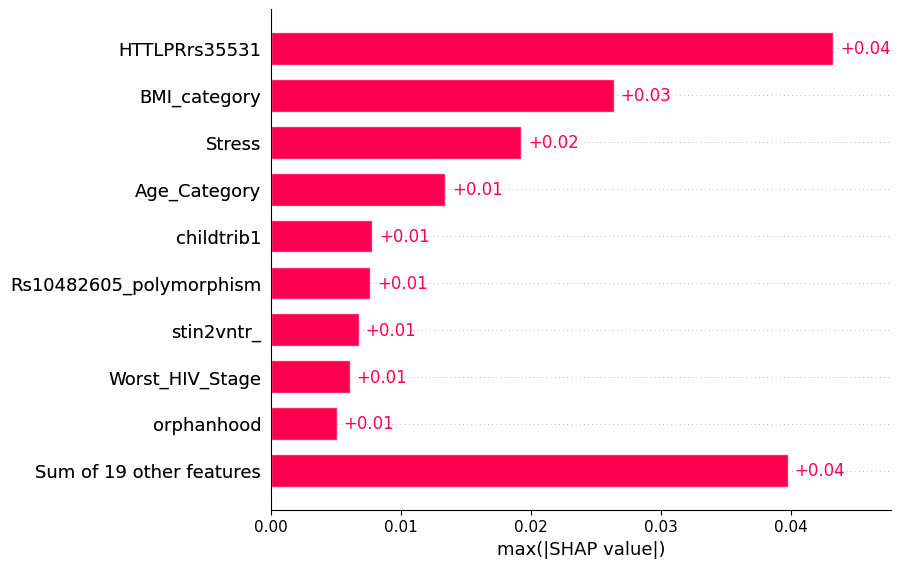

In [ ]:
shap.plots.bar(shap_values.abs.max(0))

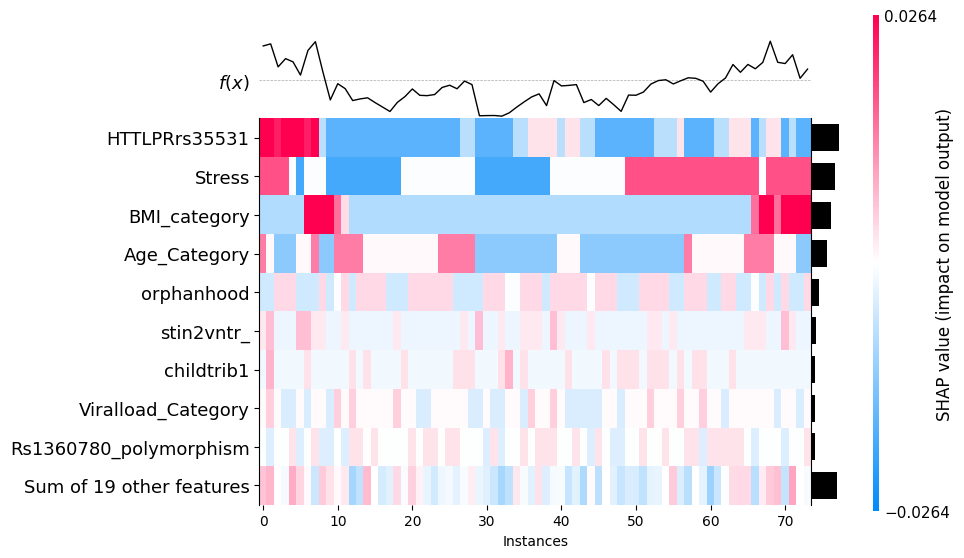

<Axes: xlabel='Instances'>

In [ ]:
shap.plots.heatmap(shap_values[:1000])